<a href="https://colab.research.google.com/github/CalculatedContent/ww-colab/blob/master/ww_kdd2020_0_111_Update010520.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Setup**

In [0]:
import pandas as pd
import numpy as np
import time
import datetime as dt
import itertools
import os
import statsmodels.api as sm
import matplotlib.pyplot as plt
from google.colab import files #Google colab ONLY

In [0]:
istart = 0
iend = istart+111

In [3]:
## If export the output to Google Drive (colab ONLY) --> Optional
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import sys
path = '/content/drive/My Drive/kdd2020_cv'
sys.path.append(path)

if not os.path.exists(path): #if the path does not already exists, create one
   !mkdir "$path"

!ls "$path"

In [0]:
!pip install weightwatcher #install from source
#!pip install powerlaw #needed if install ww from local

In [6]:
import weightwatcher as ww

# Suppress the powerlaw package warnings
# "powerlaw.py:700: RuntimeWarning: divide by zero encountered in true_divide"
# "powerlaw.py:700: RuntimeWarning: invalid value encountered in true_divide"
import warnings
warnings.simplefilter(action='ignore', category=RuntimeWarning)

# crea
import logging
logger = logging.getLogger("imported_module")
logger.setLevel(logging.CRITICAL)

Using TensorFlow backend.


# **PyTorchCV Models** 

## These cells need to be rerun multiple times to get all the data![alt text](https://)

### **1. Analyze all models in Pytorchcv**

In [0]:
!pip install pytorchcv

In [0]:
## Check storage
#import subprocess
#p = subprocess.Popen('df -h', shell=True, stdout=subprocess.PIPE)
#print(str(p.communicate()[0], 'utf-8'))

In [8]:
from pytorchcv.model_provider import get_model as ptcv_get_model
import torch

import pytorchcv
import pytorchcv.models.model_store

modelnames = pytorchcv.models.model_store._model_sha1.keys()
modelnames = list(modelnames)
print('{} models to examine'.format(len(modelnames)))

487 models to examine


In [0]:
## If you have record models that could not be found
# this_models = pd.read_excel('notfound.xlsx')[0].tolist()
# len(this_models[1:])

# Reun upto and including this cell  until all data is available

In [9]:
## Set up the data to start storing
data = {} #Store main model data
notfound = []
ww_error = []
print("istart = {}".format(istart), "and iend = {}".format(iend), 
      "\nThe code in next block will run model from #{} to #{}".format(istart+1, iend))

istart = 0 and iend = 111 
The code in next block will run model from #1 to #111


In [14]:
## Takes about 10-15 hours to run 400+ models as of 12/31/2019

ss = time.time()
i = 0
for modelname in modelnames[istart:iend]: 
    print(modelname)
    try:
        s = time.time()
        model = ptcv_get_model(modelname, pretrained=True)

    except:
        notfound.append(modelname)
        e = time.time()
        print("{} not found".format(modelname))
        print('--------------------------------------------------------')
        i += 1
        continue

    try:
        watcher = ww.WeightWatcher(model=model, logger=logger)
        results = watcher.analyze(alphas = True, spectralnorms=True, softranks=True, mp_fit = True, normalize = False)
        e = time.time()
        
        data[modelname]=watcher.get_summary()
        
        print('time spent is {}'.format((e-s)/60.))
        print('--------------------------------------------------------')
        
    except:
        ww_error.append(modelname)
        e = time.time()
        print("Error in weightwatcher operation for {}".format(modelname))
        print('--------------------------------------------------------')

    #Export/backup the results every 1 hour runtime or every 50 models  
    if ((e - ss) > 60*60) or ((i - istart)%25 == 0): 
      
        ddf = pd.DataFrame.from_dict(data).transpose()
        ddf.to_excel(path + '/data_{}-{}_{}.xlsx'.format(istart, i, dt.date.today()))
        
        ss = time.time()
        
        #try:
        #    !rm -rf /root/.torch/models #clean the memory
        #except:
        #    pass
          
    if i + istart >= iend: #Export when all models are finished
      
        ddf = pd.DataFrame.from_dict(data).transpose()
        ddf.to_excel(path + '/data_{}-{}_{}.xlsx'.format(istart, i, dt.date.today()))
        
        # break

    i += 1
    
ddf = pd.DataFrame.from_dict(data).transpose()
ddf.to_excel(path + '/data_{}-{}_{}.xlsx'.format(istart, i, dt.date.today()))

alexnet
time spent is 7.418697023391724
--------------------------------------------------------
alexnetb
time spent is 7.499468791484833
--------------------------------------------------------
zfnet
time spent is 7.544464262326558
--------------------------------------------------------
zfnetb
time spent is 10.322343790531159
--------------------------------------------------------
vgg11
time spent is 12.677771671613057
--------------------------------------------------------
vgg13
time spent is 12.989484961827596
--------------------------------------------------------
vgg16
time spent is 13.869754461447398
--------------------------------------------------------
vgg19
time spent is 14.614183656374614
--------------------------------------------------------
bn_vgg11
time spent is 12.890267233053843
--------------------------------------------------------
bn_vgg13
time spent is 12.980049935976664
--------------------------------------------------------
bn_vgg16
time spent is 13.87144

# Stop Here until all data is available

In [0]:
## Export the whole dataset mannually
# ddf = pd.DataFrame.from_dict(data).transpose()
# ddf.to_excel(path + '/df_all.xlsx')
#files.download(path + '/df_all.xlsx')
# ddf.to_excel(path + '/data_{}-{}_{}.xlsx'.format(start, i, dt.date.today()))

In [0]:
if notfound != []:
    pd.DataFrame(notfound).to_excel(path + '/notfound_{}.xlsx'.format(dt.date.today()))
    print('There are models not found')

if ww_error != []:
    pd.DataFrame(notfound).to_excel(path + '/ww_error_{}.xlsx'.format(dt.date.today()))
    print('There are models not analyzed successfully')

# Read in all pre-computed Data

In [0]:
try:
    ## Load the model results data
    # df_all = pd.read_excel('/content/drive/My Drive/df_all.xlsx')\
    #       .rename(columns = {'Unnamed: 0': 'index'}).set_index('index')
    df_all = pd.read_excel(path + '/df_all.xlsx', index_col = 0)
    # print(df_all)
except:
    ## If the above cell runs different batches of the data
    ## Use this cell to concat the data together
    print('Concating files...')
    df_all = pd.DataFrame()
    for f in os.listdir(path):
        if f.startswith('data_'): #detect data
            tempp = pd.read_excel(path + '/' + f)\
                        .rename(columns = {'Unnamed: 0':'modelname'})
            df_all = pd.concat([df_all, tempp], axis = 0, sort = False)
            print(f)
            print(df_all.tail(1))

    del tempp

    df_all = df_all.drop_duplicates().set_index('modelname')#.reset_index(drop = True)
    df_all = df_all.loc[modelnames, :]
    df_all = df_all.reset_index()
    df_all.to_excel(path + '/df_all.xlsx')

#rint(len(df_all))
#df_all.dropna(inplace=True)
#print(len(df_all))

In [11]:
df_all

,modelname,alpha,alpha_compound,alpha_weighted,alpha_weighted_compound,check,checkTF,checkTF_compound,check_compound,lognorm,lognormX,lognormX_compound,lognorm_compound,logpnorm,logpnorm_compound,logspectralnorm,logspectralnorm_compound,norm,normX,normX_compound,norm_compound,numofSpikes,numofSpikes_compound,ratio_numofSpikes,ratio_numofSpikes_compound,sigma_mp,sigma_mp_compound,softrank,softrank_compound,softrank_mp,softrank_mp_compound,softranklog,softranklog_compound,softranklogratio,softranklogratio_compound,spectralnorm,spectralnorm_compound
0,alexnet,2.653116,2.629965,3.361279,3.131412,6.312063,0.193182,0.383333,1.803071,1.213128,1.587062,1.522654,1.270097,3.811582,3.626827,1.812696,1.299864,17.027948,50.047062,37.898106,19.122663,39.181818,93.934603,0.221105,0.142307,0.796720,0.724677,15.736961,26.715962,0.123766,0.121950,1.145412,1.348129,1.961531,2.196280,110.108810,34.962147
1,alexnetb,2.591940,2.611971,3.114341,3.013202,5.415376,0.204545,0.393333,1.641999,1.158144,1.507646,1.472359,1.238356,3.551809,3.467992,1.663680,1.251299,15.142357,42.394821,33.721260,18.014004,32.581818,96.579048,0.224065,0.145615,0.862794,0.743370,14.278321,24.886991,0.151018,0.130632,1.100462,1.313405,1.977554,2.185516,80.635475,28.471046
2,zfnet,2.756450,2.674295,3.673229,3.257409,4.725841,0.211538,0.305556,1.786327,1.228810,1.632585,1.541956,1.275319,4.081376,3.739922,1.672296,1.318818,17.195885,47.623081,37.862602,19.206074,40.036364,92.902857,0.225115,0.144605,0.790251,0.719677,14.951624,26.439746,0.108592,0.113837,1.118418,1.335730,1.885556,2.168971,77.114090,33.421925
3,zfnetb,2.655884,2.636655,3.646447,3.286362,5.037417,0.221154,0.319444,1.844308,1.272548,1.687328,1.585046,1.315737,4.095295,3.805100,1.732795,1.354696,19.061750,53.744839,41.878025,21.009226,63.672727,132.488889,0.265277,0.182669,0.706738,0.650784,17.095301,29.968735,0.063393,0.074588,1.162326,1.386917,1.894057,2.190090,91.156982,38.146049
4,vgg11,2.718865,2.633820,3.173529,3.013562,1.943881,0.653333,0.494949,1.474718,1.199311,1.497726,1.491117,1.242720,3.634474,3.530661,1.267745,1.222273,16.136616,33.025490,32.176971,18.019598,31.818182,87.777778,0.132913,0.131504,0.826833,0.757683,19.147906,26.872274,0.196762,0.169916,1.226026,1.337490,2.089823,2.210968,25.952868,22.639509
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
482,deeplabv3_resnetd152b_coco,2.887717,3.332444,-1.432174,-2.129695,0.221127,0.012678,0.005323,0.098040,0.365471,-0.092243,-0.202368,0.346900,-0.931139,-1.615885,-0.416209,-0.579491,2.412311,0.953282,0.720707,2.300478,0.304839,0.518293,0.002519,0.002761,0.725987,0.478709,17.433679,22.434917,5.898827,3.135045,1.168693,1.296581,-8.547832,-4.301868,0.573892,0.401596
483,fcn8sd_resnetd101b_voc,2.917564,3.534407,-1.052574,-1.906819,0.271099,0.028986,0.012121,0.119696,0.445998,0.058210,-0.078960,0.418492,-0.554870,-1.404826,-0.261557,-0.462366,2.860095,1.288470,0.942024,2.693862,0.439206,0.798546,0.003507,0.004424,0.744781,0.484614,18.148757,24.686489,4.436963,2.399719,1.182927,1.331715,-3.648926,-2.384589,0.798497,0.536068
484,fcn8sd_resnetd50b_ade20k,3.203384,3.976425,-0.051974,-0.584767,0.484099,0.321586,0.137476,0.217476,0.646541,0.448409,0.334916,0.627576,0.469537,-0.128586,0.106991,-0.073534,4.657781,3.305564,2.823442,4.557288,4.417431,7.821839,0.023492,0.041011,0.752164,0.508415,21.795708,27.461957,2.151891,1.190297,1.229999,1.350106,13.647176,3.186268,2.088372,1.462466
485,fcn8sd_resnetd101b_ade20k,3.029271,3.738674,-0.429449,-1.157904,0.361532,0.060386,0.025253,0.158725,0.579748,0.304781,0.178509,0.555188,0.081978,-0.657578,-0.038918,-0.245442,3.891084,2.295727,1.854982,3.730307,2.232099,5.211009,0.012277,0.026704,0.768687,0.494822,20.091776,27.036359,2.814111,1.494122,1.223939,1.368221,-1.978524,-2.362513,1.364539,0.894286


In [0]:
## Get the modelname of outliers
# temp = df_all.copy()
# temp = temp.sort_values(['softrank'], ascending = False)
# outliers_sr = temp['modelname'].tolist()[:10]

# temp = temp.sort_values(['spectralnorm'], ascending = False)
# outliers_sp = temp['modelname'].tolist()[:10]

# [s for s in outliers_sp if s not in outliers_sr]

In [0]:
## Get the details of outliers
# writer = pd.ExcelWriter('/content/drive/My Drive/sp_outliers.xlsx')
# for s in [s for s in outliers_sp if s not in outliers_sr]:#outliers:
#     model = ptcv_get_model(s, pretrained=True) #'resnet542bn_svhn'
#     watcher = ww.WeightWatcher(model=model, logger=logger)
#     results = watcher.analyze(compute_alphas = False, compute_spectralnorms=True, compute_softranks=True)
    
#     temp1 = watcher.get_details()
#     temp1.to_excel(writer, s)
    
# writer.save()

### **2. Plots with Test Accuracies**

In [0]:
from bs4 import BeautifulSoup
import requests
import re

In [0]:
'''Load the test accuracies'''
url = "https://github.com/osmr/imgclsmob/blob/master/pytorch/README.md"
df_accuracy = pd.read_html(url)

In [0]:
'''Create the matchtable: Match the model name'''
response = requests.get(url)
page = str(BeautifulSoup(response.content, features="lxml"))

## To find the category of models to group when plotting
models = re.findall('<li>(.*) \(<a href=', page) 

## The naming convention is not very consistent, therefore, to help with identification,
## I input the exceptions
exceptions = {'SqueezeNext': 'SqNxt', 'DIA-ResNet': 'DIA-PreResNet', 
              'DarkNet Ref/Tiny/19': 'DarkNet Tiny', 
              'IBN-ResNet/IBN-ResNeXt/IBN-DenseNet': 'IBN(b)-ResNet'} 
models_ = [m if m not in exceptions.keys() else m+'/'+exceptions[m] for m in models]
models_ = [m.split('/') for m in models_]

## Use reg exp to extract the dataset name, modelnames (used in README), and 
## modelnames (used in codes)
datasets = re.findall('<h3><a aria-hidden="true" class="anchor" href="#(.*)" id', page)
lst1_name = re.findall('<tr>\n<td>(.*)</td>', page)
lst2_name = re.findall('\n<td>.* \(<a href="(.*)">log</a>\)</td>\n</tr>', page)

if len(lst1_name) != len(lst2_name):
    print('Number does not match!')

df_table = pd.DataFrame(lst1_name, columns = ['Model'])

## Note: there are duplicate Model names, hence cannot use merge naively
df_table['modelname'] = [m.split('/')[-1][:-22] for m in lst2_name]

In [0]:
'''Identify the architexture for each pretrained model'''
class ContinueI(Exception):
    pass

continue_i = ContinueI()

arch = []
for i in range(len(df_table)):
    try:
        for mm in models_:
            for m1 in mm:
                ## Name convention 1: the model name starts with the arch name
                if df_table.loc[i, 'Model'].startswith(m1): 
                    arch.append(mm)
                    raise continue_i
        try:
            ## Name convention 2: if the model name starts with number, 
            ## the arch name is in the middle of the model name
            this = re.findall('[0-9]+-(.*)', df_table.loc[i, 'Model'])[0]
        except:
            arch.append(np.nan)
            raise continue_i

        for mm in models_:
            for m1 in mm:
                if this.startswith(m1):
                    arch.append(mm)

                    raise continue_i

        arch.append(np.nan)

    except ContinueI:
        continue

df_table['group'] = arch
df_table['group'] = df_table['group'].apply(lambda x: '/'.join(x))


In [0]:
'''Match the model name using matchtable'''
# df_all = pd.read_excel(path + '/df_all.xlsx').rename(columns = {'Unnamed: 0': 'index'}).set_index('index')
df_all['spectralnormlog'] = np.log(df_all['spectralnorm'])

df_full = []
i = 0

for df in df_accuracy:
    # Because there are duplicate Model names (on README), you cannot
    # simply use merge
    df = df.copy()
    df['modelname'] = df_table.loc[i:i+len(df)-1, 'modelname'].tolist()#temp[i:i+len(df)]
    df['group'] = df_table.loc[i:i+len(df)-1, 'group'].tolist()
    i += len(df)

    del df['Remarks']

    df = df.merge(df_all, on = 'modelname', how = 'left')

    df_full.append(df)

df_full = dict(zip(datasets, df_full))

del df

In [17]:
## Example: Look at the imagenet-1K model output
df_full['imagenet-1k']

,Model,Top1,Top5,Params,FLOPs/2,modelname,group,alpha,alpha_compound,alpha_weighted,alpha_weighted_compound,check,checkTF,checkTF_compound,check_compound,lognorm,lognormX,lognormX_compound,lognorm_compound,logpnorm,logpnorm_compound,logspectralnorm,logspectralnorm_compound,norm,normX,normX_compound,norm_compound,numofSpikes,numofSpikes_compound,ratio_numofSpikes,ratio_numofSpikes_compound,sigma_mp,sigma_mp_compound,softrank,softrank_compound,softrank_mp,softrank_mp_compound,softranklog,softranklog_compound,softranklogratio,softranklogratio_compound,spectralnorm,spectralnorm_compound,spectralnormlog
0,AlexNet,40.96,18.24,62378344,"1,132.33M",alexnet,AlexNet,2.653116,2.629965,3.361279,3.131412,6.312063,0.193182,0.383333,1.803071,1.213128,1.587062,1.522654,1.270097,3.811582,3.626827,1.812696,1.299864,17.027948,50.047062,37.898106,19.122663,39.181818,93.934603,0.221105,0.142307,0.796720,0.724677,15.736961,26.715962,0.123766,0.121950,1.145412,1.348129,1.961531,2.196280,110.108810,34.962147,4.701469
1,AlexNet-b,41.58,19.00,61100840,714.83M,alexnetb,AlexNet,2.591940,2.611971,3.114341,3.013202,5.415376,0.204545,0.393333,1.641999,1.158144,1.507646,1.472359,1.238356,3.551809,3.467992,1.663680,1.251299,15.142357,42.394821,33.721260,18.014004,32.581818,96.579048,0.224065,0.145615,0.862794,0.743370,14.278321,24.886991,0.151018,0.130632,1.100462,1.313405,1.977554,2.185516,80.635475,28.471046,4.389939
2,ZFNet,39.79,17.27,62357608,"1,170.33M",zfnet,ZFNet,2.756450,2.674295,3.673229,3.257409,4.725841,0.211538,0.305556,1.786327,1.228810,1.632585,1.541956,1.275319,4.081376,3.739922,1.672296,1.318818,17.195885,47.623081,37.862602,19.206074,40.036364,92.902857,0.225115,0.144605,0.790251,0.719677,14.951624,26.439746,0.108592,0.113837,1.118418,1.335730,1.885556,2.168971,77.114090,33.421925,4.345286
3,ZFNet-b,36.37,14.90,107627624,"2,479.13M",zfnetb,ZFNet,2.655884,2.636655,3.646447,3.286362,5.037417,0.221154,0.319444,1.844308,1.272548,1.687328,1.585046,1.315737,4.095295,3.805100,1.732795,1.354696,19.061750,53.744839,41.878025,21.009226,63.672727,132.488889,0.265277,0.182669,0.706738,0.650784,17.095301,29.968735,0.063393,0.074588,1.162326,1.386917,1.894057,2.190090,91.156982,38.146049,4.512583
4,VGG-11,29.90,10.36,132863336,"7,615.87M",vgg11,VGG/BN-VGG,2.718865,2.633820,3.173529,3.013562,1.943881,0.653333,0.494949,1.474718,1.199311,1.497726,1.491117,1.242720,3.634474,3.530661,1.267745,1.222273,16.136616,33.025490,32.176971,18.019598,31.818182,87.777778,0.132913,0.131504,0.826833,0.757683,19.147906,26.872274,0.196762,0.169916,1.226026,1.337490,2.089823,2.210968,25.952868,22.639509,3.256282
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
251,MixNet-M,22.93,6.60,5014382,366.68M,mixnet_m,MixNet,5.037776,5.037776,4.595425,4.595425,0.360158,0.028571,0.003436,0.151640,1.115761,1.356870,1.356870,1.115761,4.921886,4.921886,0.843860,0.772618,14.981972,31.407087,31.407087,14.981972,57.642857,57.642857,0.455409,0.455409,0.965578,0.965578,24.999028,24.999028,0.306807,0.306807,1.297212,1.297212,2.622270,2.622270,13.500457,9.309176,2.602724
252,MixNet-L,21.12,5.82,7329252,591.34M,mixnet_l,MixNet,4.207929,4.207929,4.126702,4.126702,0.328306,0.038095,0.004582,0.136112,1.130777,1.384797,1.384797,1.130777,4.531132,4.531132,0.926436,0.856777,15.469102,33.186310,33.186310,15.469102,61.896552,61.896552,0.460166,0.460166,0.952021,0.952021,23.955696,23.955696,0.251126,0.251126,1.295729,1.295729,2.474121,2.474121,16.094845,11.322827,2.778499
253,ResNet(D)-50b,21.04,5.65,25680808,"20,497.60M",resnetd50b,ResNet,3.592766,3.997007,1.295728,0.880893,0.734454,0.774038,0.319444,0.317371,0.831089,0.814939,0.686675,0.808461,1.803401,1.385736,0.454681,0.253305,7.282118,7.626557,6.354174,7.152150,7.703518,24.818182,0.037639,0.093492,0.840987,0.583746,23.443366,29.784345,1.185150,0.684582,1.247373,1.383282,-1.276206,-20.486450,4.261870,2.885237,1.449708
254,R

In [0]:
'''[SETUP CELL] Start Plotting'''
#metrics = ['alpha', 'alpha_weighted', 'spectralnormlog', 'softrank', 'norm', 'norm_compound' ] #specify the ww matrics
#metrics_acc = ['Top1', 'Top5', 'Error, %', 'Pix.Acc.,%', 'mIoU,%'] #specify the test accuracy

metrics = ['alpha', 'alpha_weighted', 'spectralnormlog',  'softranklog',  'lognorm' ,'logpnorm' ] #specify the ww matrics
metrics_acc = ['Top1', 'Error, %', 'Pix.Acc.,%', 'mIoU,%'] #specify the test accuracy

num_rows = 2
num_cols = 3

/usr/local/lib/python3.6/dist-packages/numpy/core/fromnumeric.py:2495: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


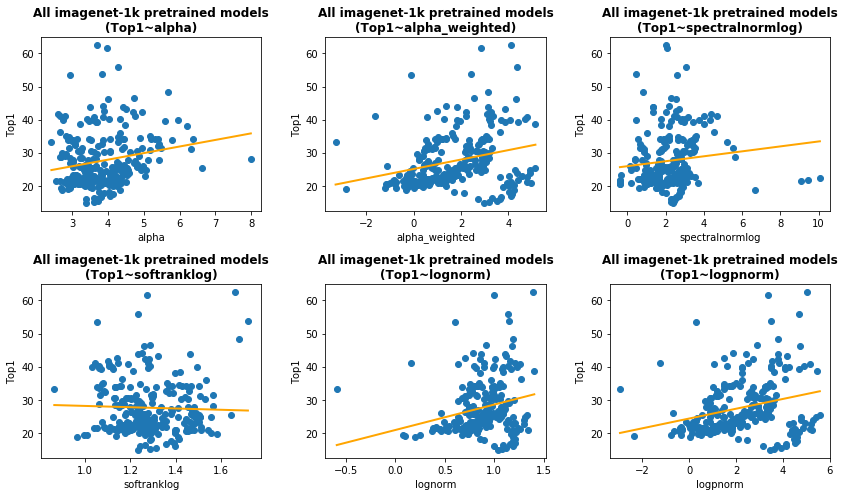

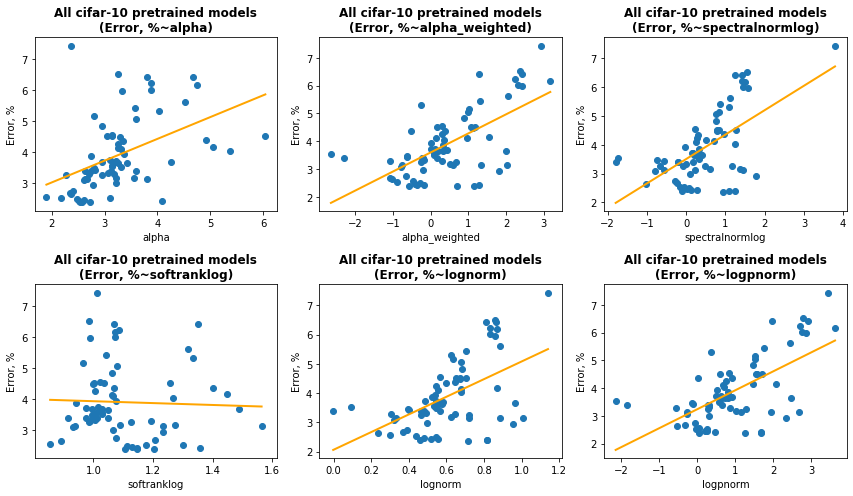

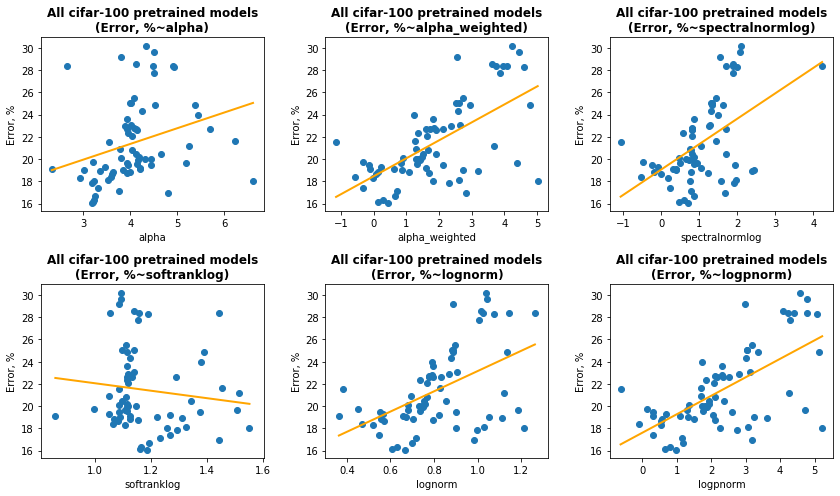

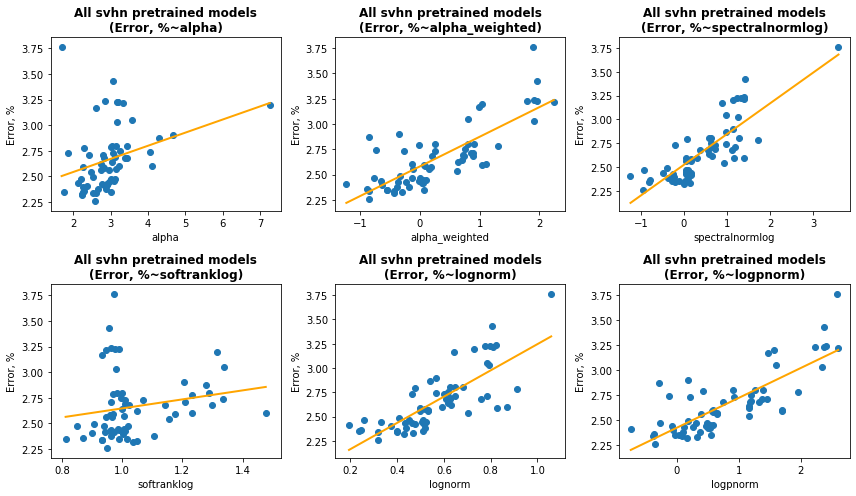

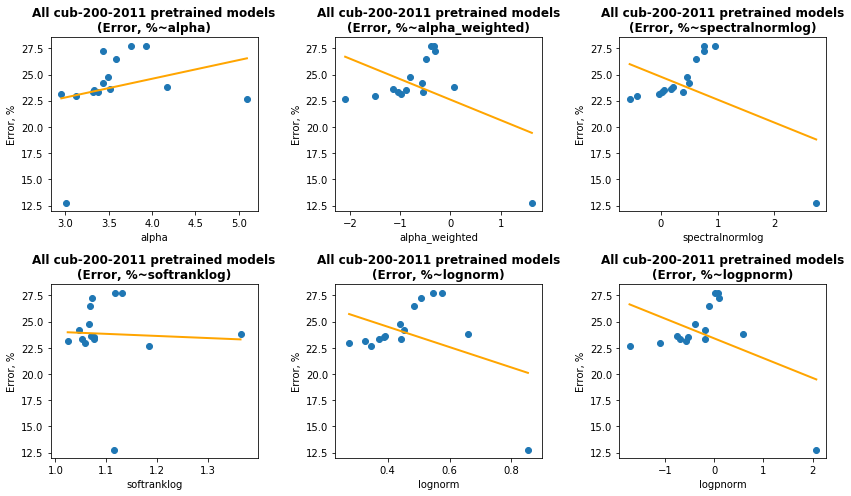

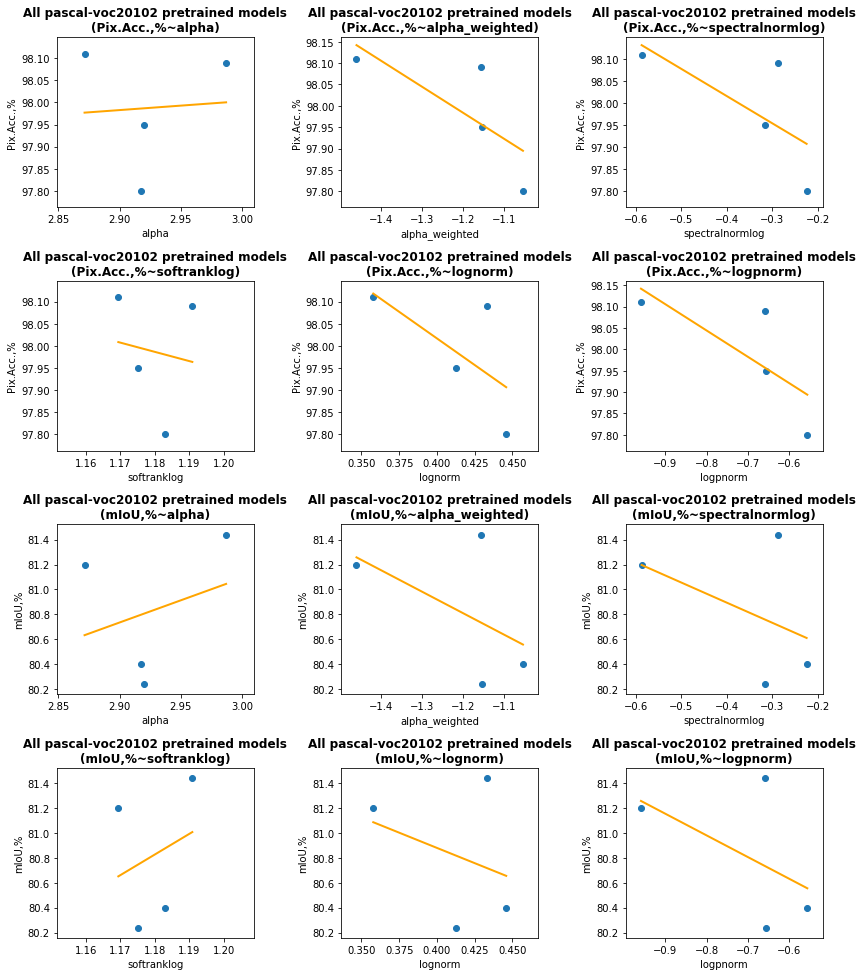

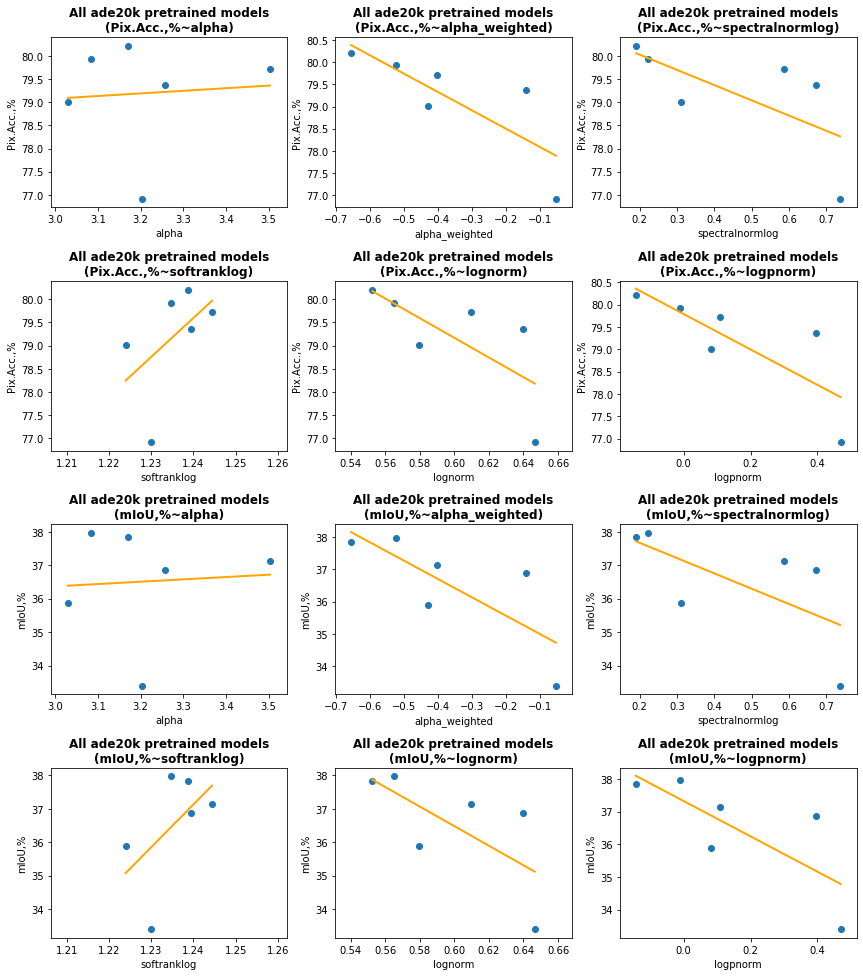

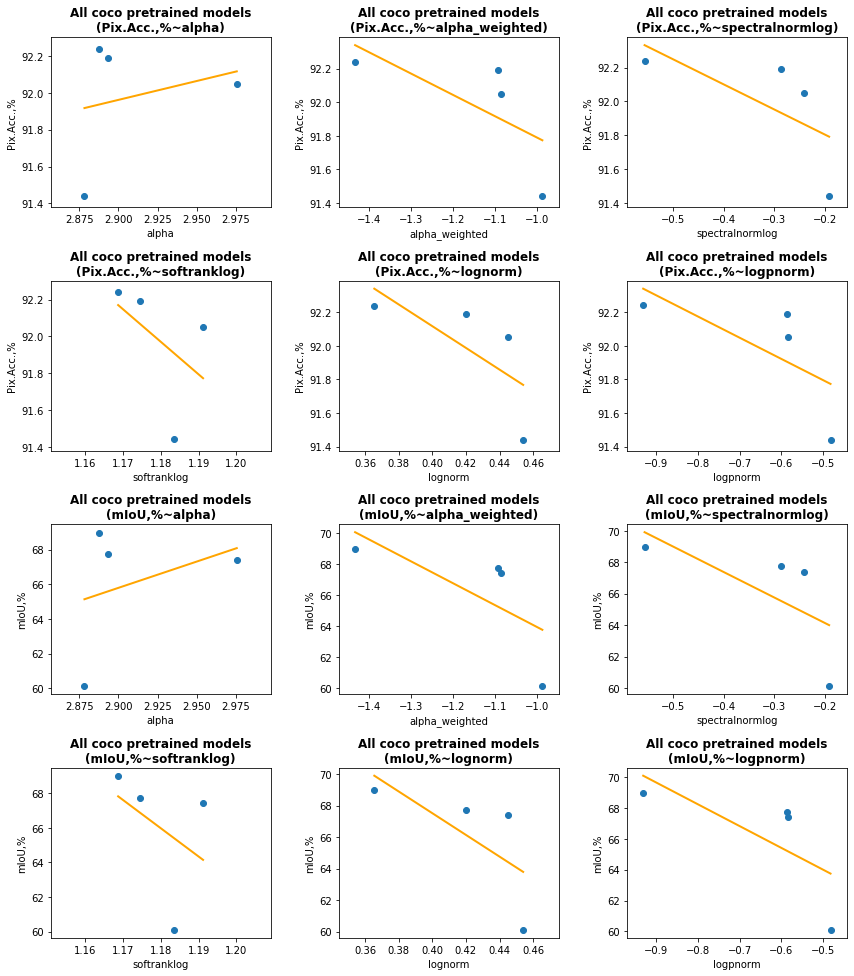

In [19]:
%matplotlib inline
plot_fit = True

'''Plotting by datasets'''
df_fit0 = []

for d in datasets:
    temp = df_full[d].copy()

    if len(temp) == 1:
        continue

    tacc = [c for c in metrics_acc if c in temp.columns]

    #plotloc = int(len(tacc)*len(metrics)/num_rows*100 + 10*num_cols + 1)
    plotrow = int(len(tacc)*len(metrics)/num_rows)
    plotcol = num_cols
    plotidx = 1

    if len(tacc) > 1:
        plt.figure(figsize = (12,20))
    else:
        plt.figure(figsize = (12,10))

    for ac in tacc:
        for x in metrics:
            plt.subplot(plotrow, plotcol, plotidx) #plt.subplot(plotloc)
            plt.scatter(temp[x], temp[ac])
            plt.xlabel(x)
            plt.ylabel(ac)
            plt.title('All {} pretrained models\n({}~{})'.format(d, ac, x), 
                      fontweight = 'bold')

            if plot_fit == True:
                temp = temp.dropna().reset_index(drop = True)
                this_fit = sm.OLS(temp[ac], sm.add_constant(temp[x])).fit()
                this_x = np.linspace(min(temp[x]), max(temp[x]), 1000)
                plt.plot(this_x, this_fit.predict(sm.add_constant(this_x)), linewidth = 2, color = 'orange')
                df_fit0.append([d, ac, x, this_fit.ssr/len(temp), this_fit.rsquared])
            
            #plotloc += 1
            plotidx += 1

    plt.tight_layout()

del temp
del tacc

if df_fit0 != []:
    df_fit0 = pd.DataFrame(df_fit0, columns = ['dataset', 'test accuracy', 'x variable', 'MSE', 'r^2'])

In [20]:
if type(df_fit0) != list:
    print(df_fit0.head(20)) #print the first 20 rows of the regression fit

        dataset test accuracy       x variable        MSE       r^2
0   imagenet-1k          Top1            alpha  64.512736  0.039351
1   imagenet-1k          Top1   alpha_weighted  62.244982  0.073120
2   imagenet-1k          Top1  spectralnormlog  66.174847  0.014601
3   imagenet-1k          Top1      softranklog  67.076888  0.001169
4   imagenet-1k          Top1          lognorm  63.606232  0.052850
5   imagenet-1k          Top1         logpnorm  62.052027  0.075993
6      cifar-10      Error, %            alpha   1.131283  0.207937
7      cifar-10      Error, %   alpha_weighted   0.825175  0.422257
8      cifar-10      Error, %  spectralnormlog   0.914056  0.360027
9      cifar-10      Error, %      softranklog   1.426312  0.001373
10     cifar-10      Error, %          lognorm   1.033260  0.276567
11     cifar-10      Error, %         logpnorm   0.850370  0.404617
12    cifar-100      Error, %            alpha  12.234624  0.086155
13    cifar-100      Error, %   alpha_weighted  

# Drop additional NaN models that somehow went wrong here

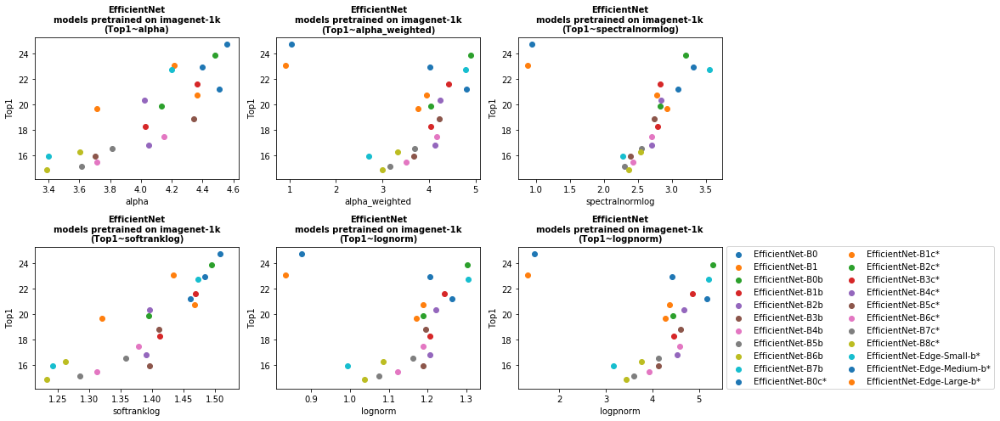

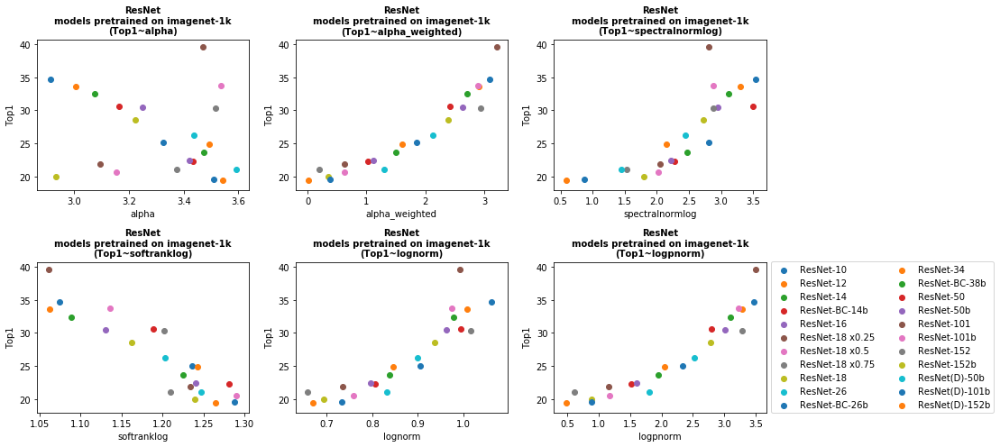

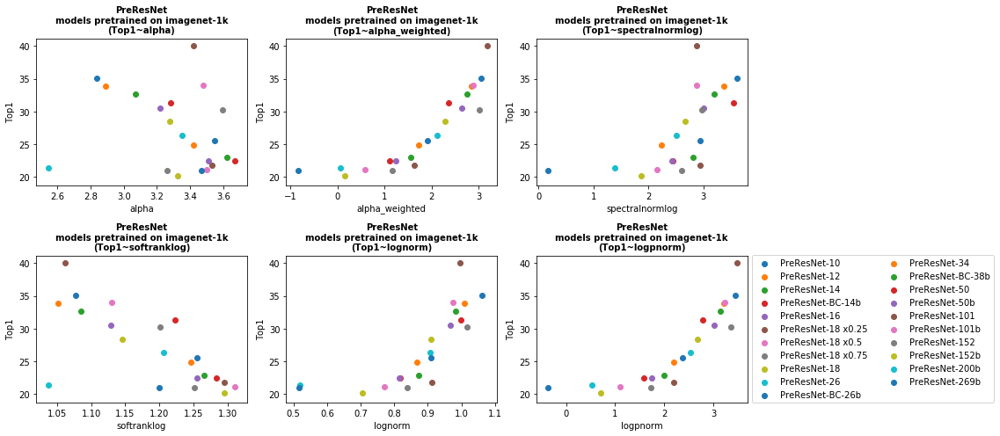

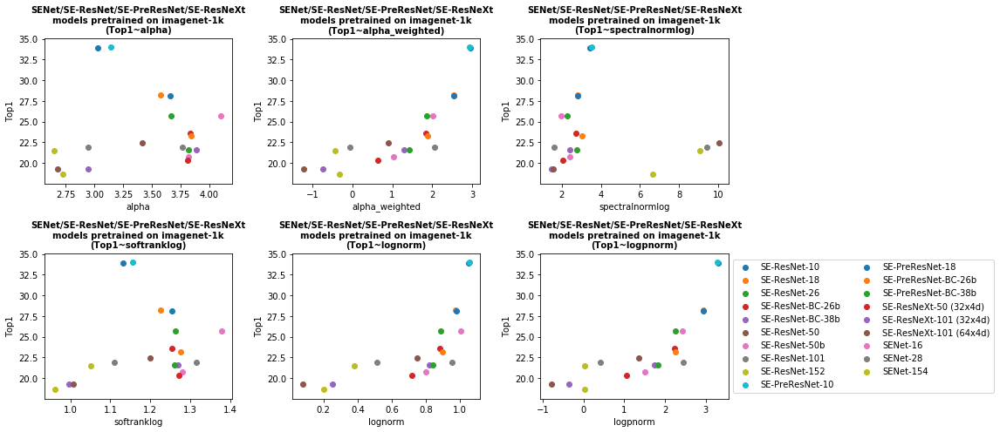

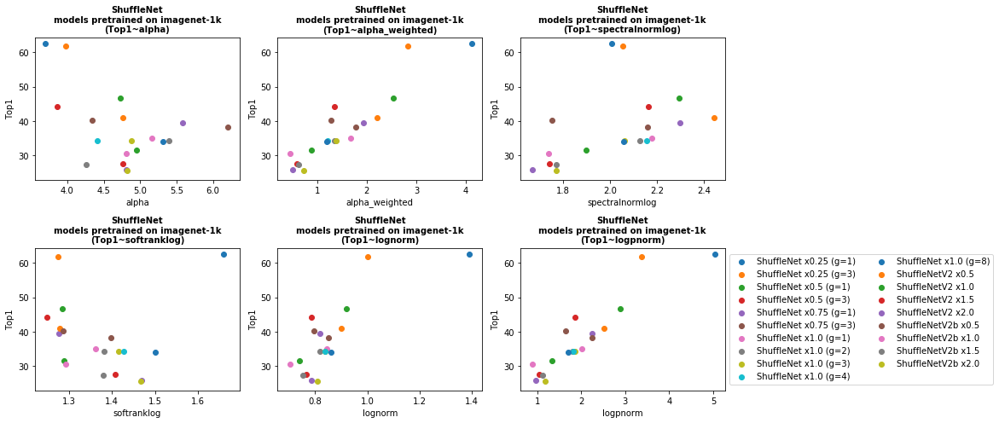

...

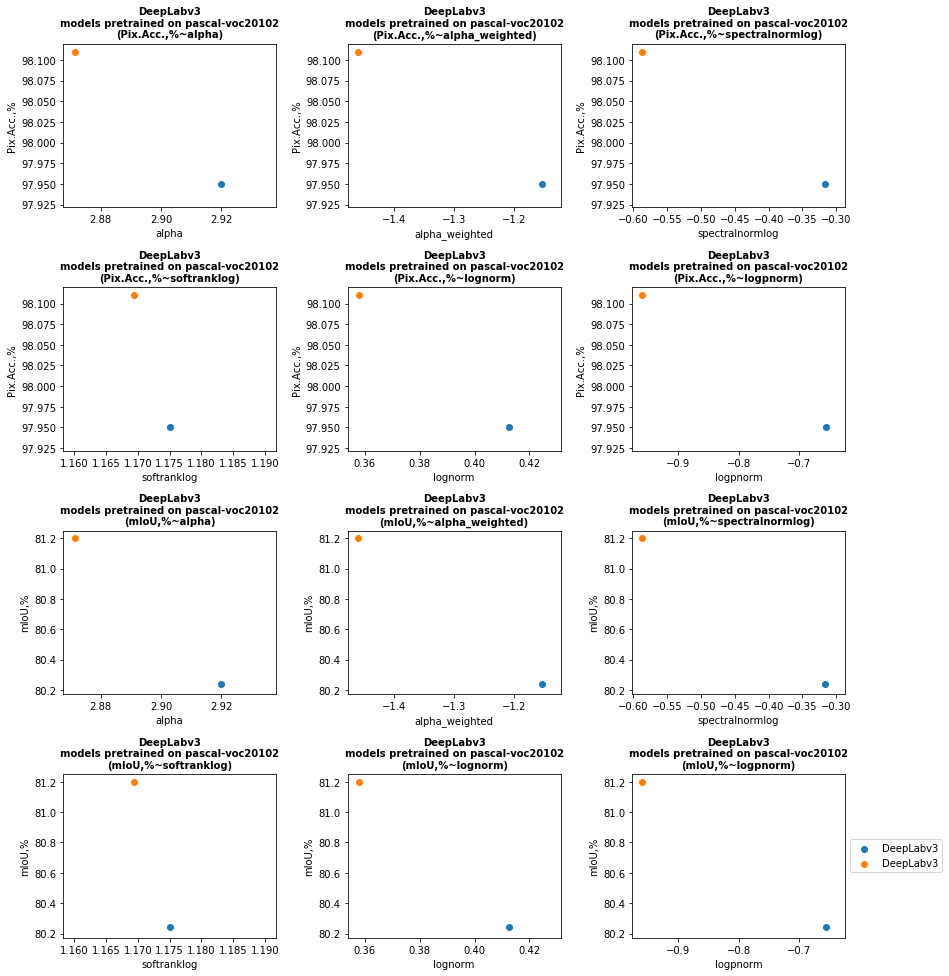

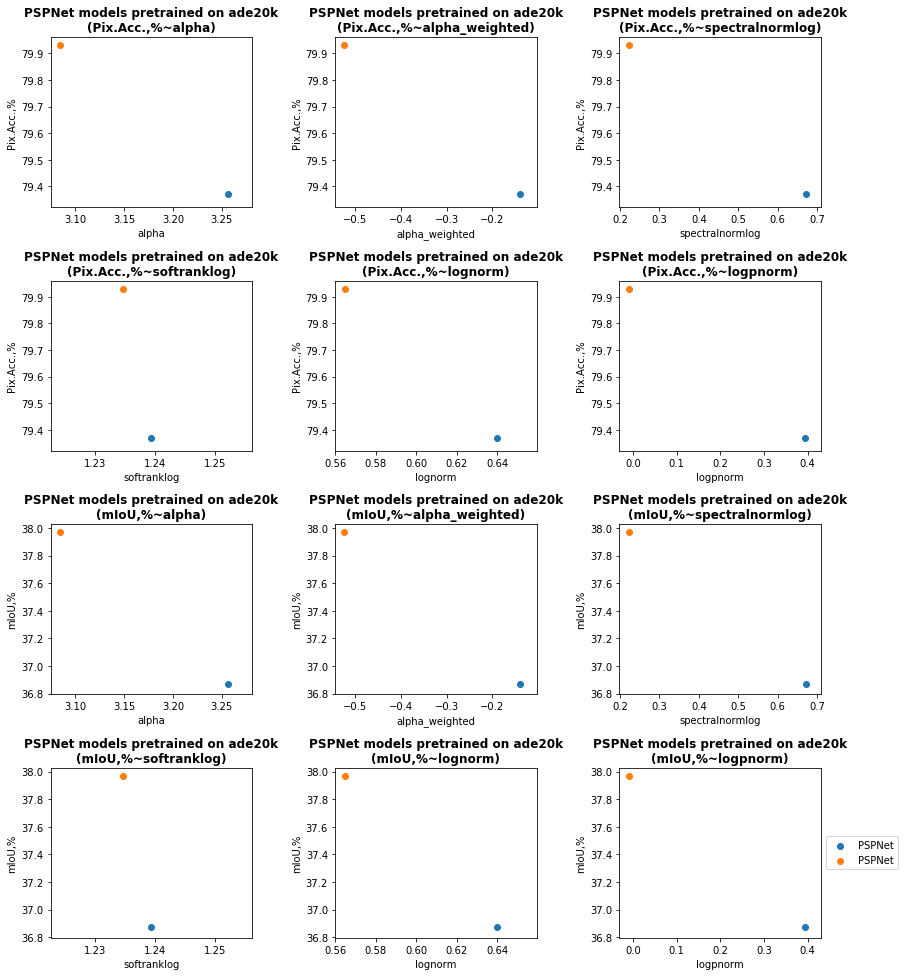

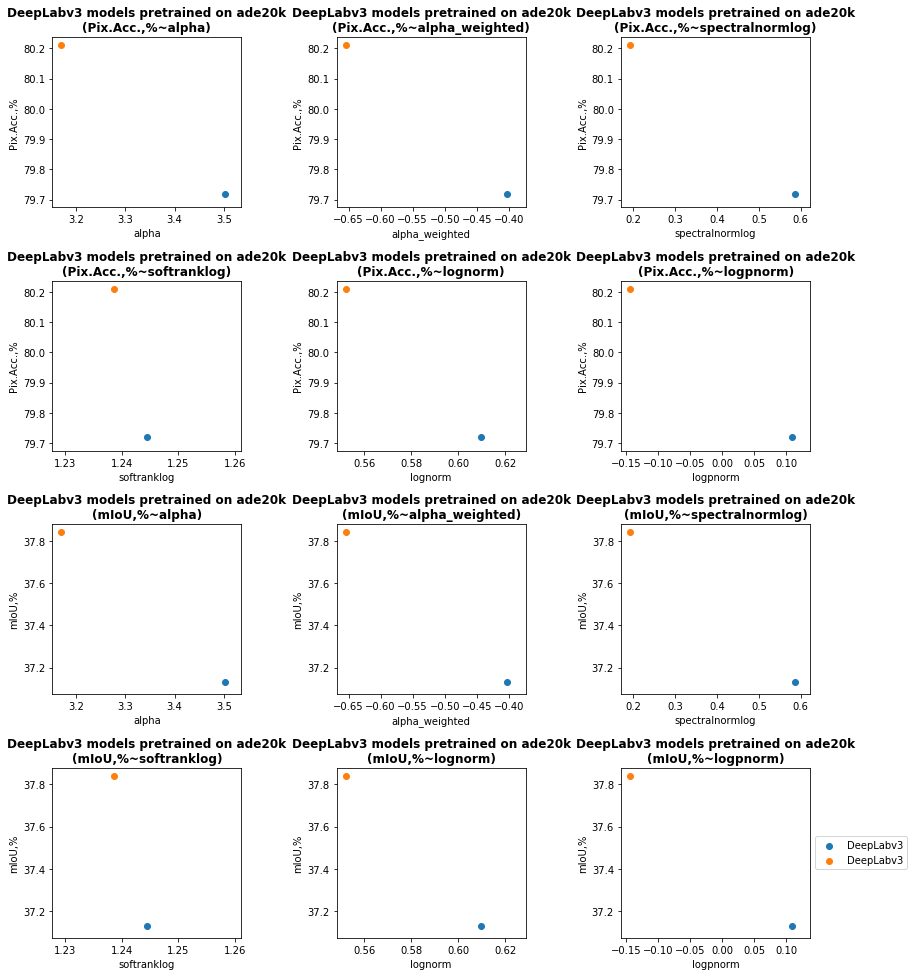

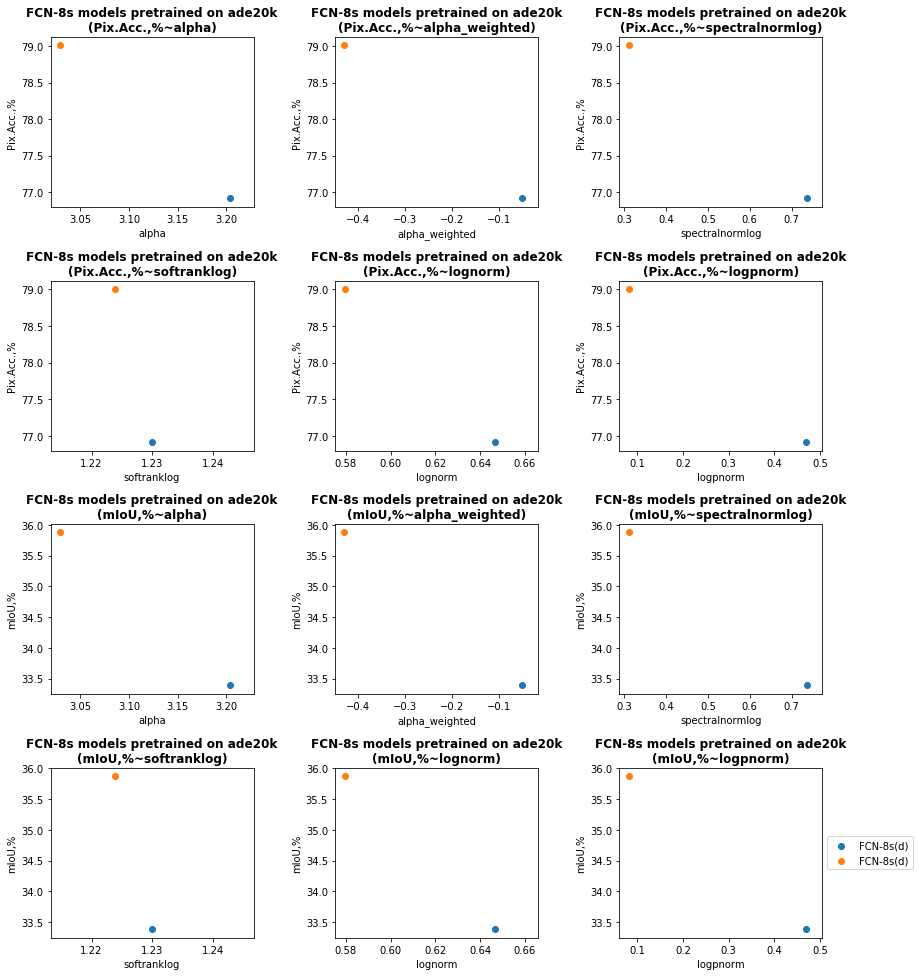

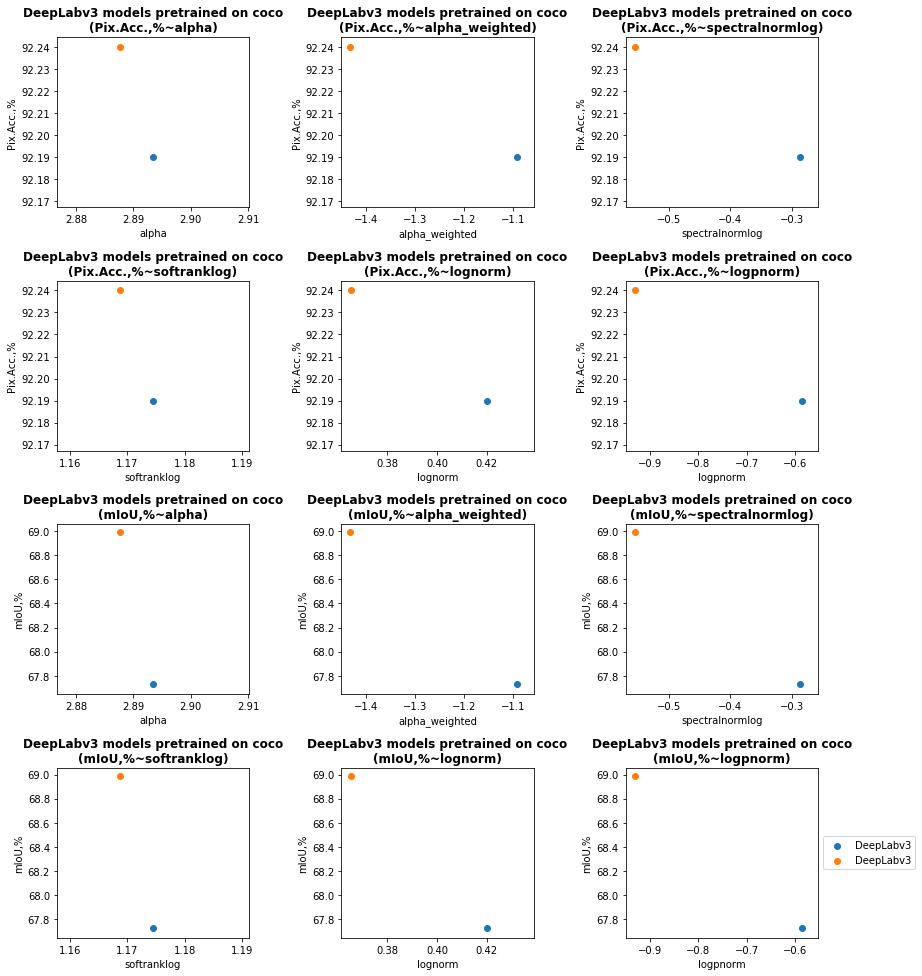

In [21]:
'''Plotting by architectures within each datasets'''
groups = df_table['group'].value_counts().to_frame()

for d in datasets:
    df = df_full[d].copy()
    this_groups = df['group'].value_counts().to_frame()

    for g in this_groups[this_groups['group'] > 1].index:

        this_group = df[df['group'] == g].copy()
        this_group = this_group.reset_index(drop = True)

        tacc = [c for c in metrics_acc if c in this_group.columns]

        #plotloc = int(len(tacc)*len(metrics)/num_rows*100 + 10*num_cols + 1)
        plotrow = int(len(tacc)*len(metrics)/num_rows)
        plotcol = num_cols
        plotidx = 1

        if len(tacc) > 1:
            plt.figure(figsize = (12,20))
        else:
            plt.figure(figsize = (12,10))

        for ac in tacc:#metrics_acc:
            for x in metrics:
                plt.subplot(plotrow, plotcol, plotidx) #plt.subplot(plotloc)
                for i in range(len(this_group)):
                    plt.scatter(this_group.loc[i,x], this_group.loc[i, ac])
                plt.xlabel(x)
                plt.ylabel(ac)
                if (len(g) > 20) | (len(g) + len(d) >= 17): #To avoid overlap in title
                    plt.title('{}\nmodels pretrained on {}\n({}~{})'.format(g, d, ac, x), 
                              fontweight = 'bold', fontsize = 10)
                else:
                    plt.title('{} models pretrained on {}\n({}~{})'.format(g, d, ac, x), 
                              fontweight = 'bold')

                #plotloc += 1
                plotidx += 1

            #plt.legend(this_group['Model'], loc='center left',bbox_to_anchor=(1, 0.5))          
          
        plt.tight_layout()
            
        if len(this_group['Model']) > 12:
            plt.legend(this_group['Model'], loc='center left', ncol = 2, bbox_to_anchor=(1, 0.5))                      
        else:
            plt.legend(this_group['Model'], loc='center left', bbox_to_anchor=(1, 0.5))  

del this_groups
del this_group
del df

# Fit a linear regression on to the graphs from above


/usr/local/lib/python3.6/dist-packages/numpy/core/fromnumeric.py:2495: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


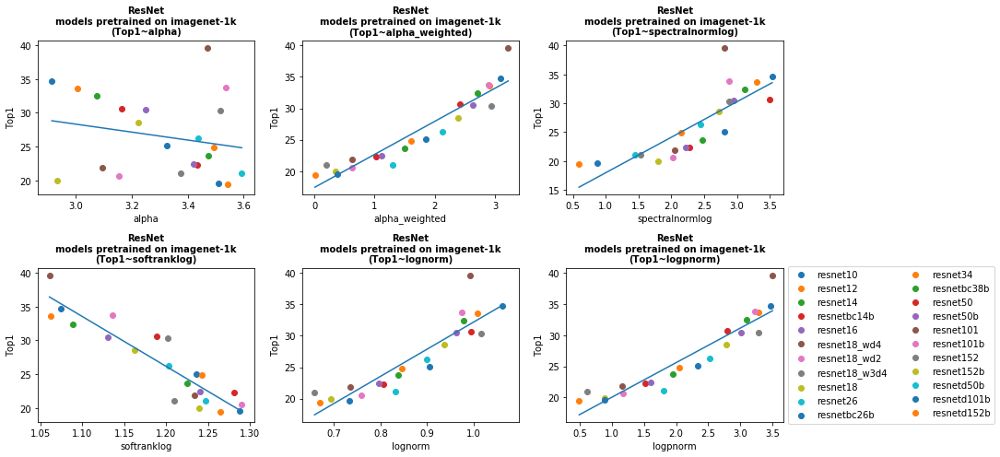

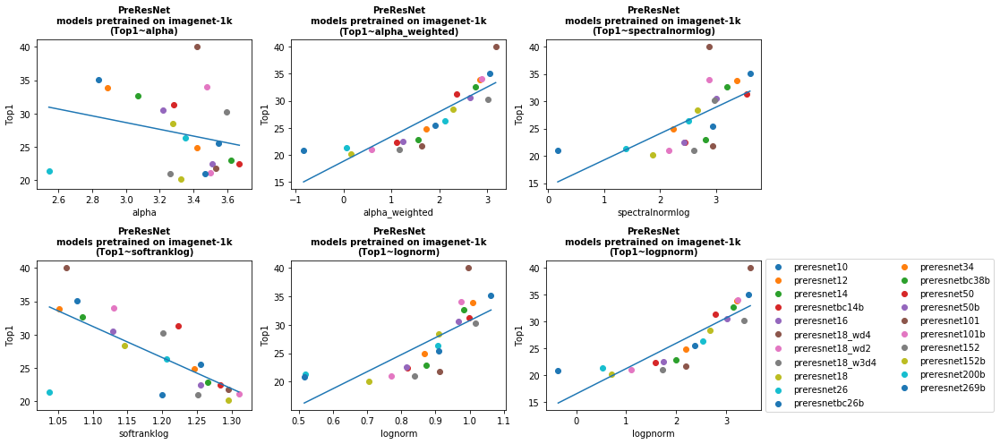

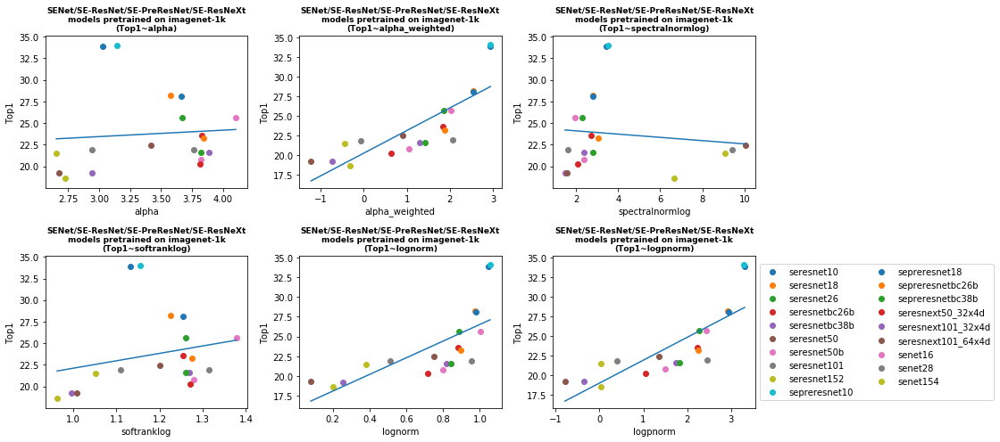

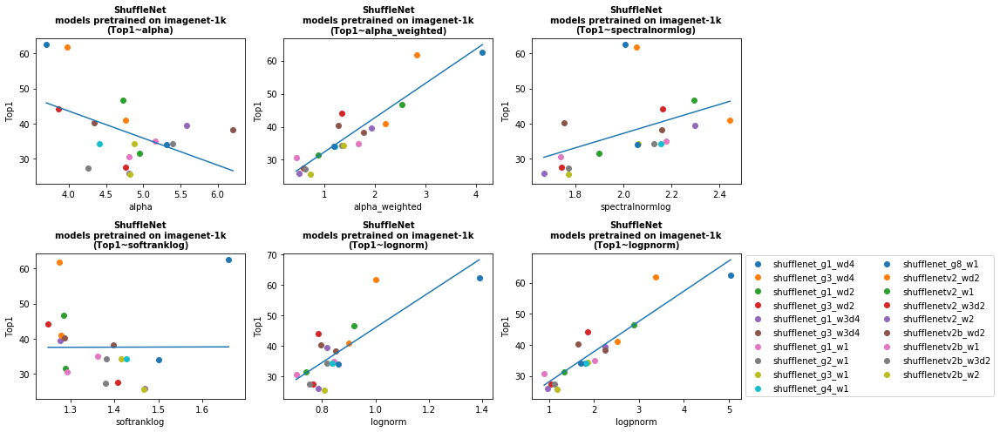

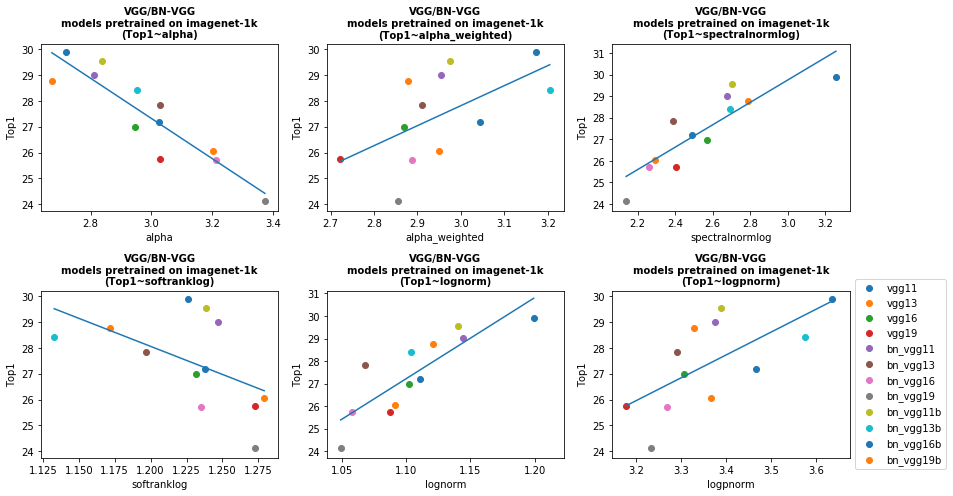

...

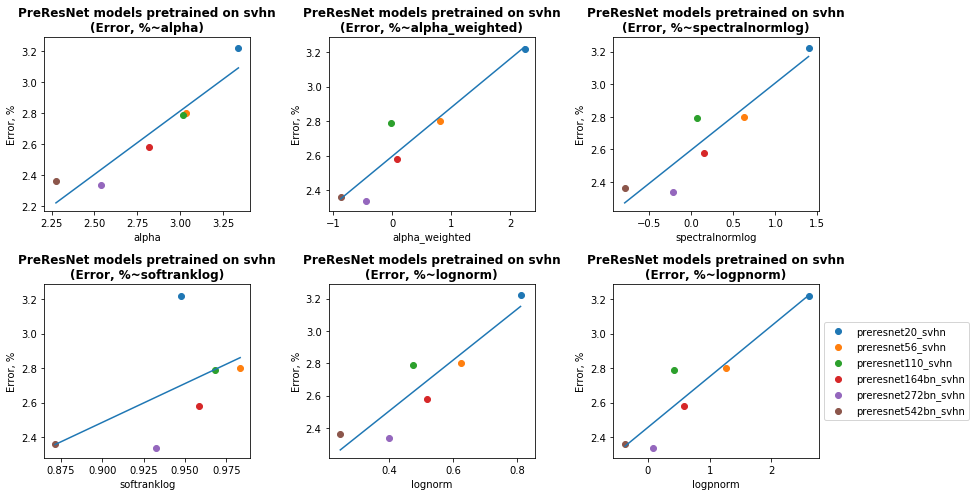

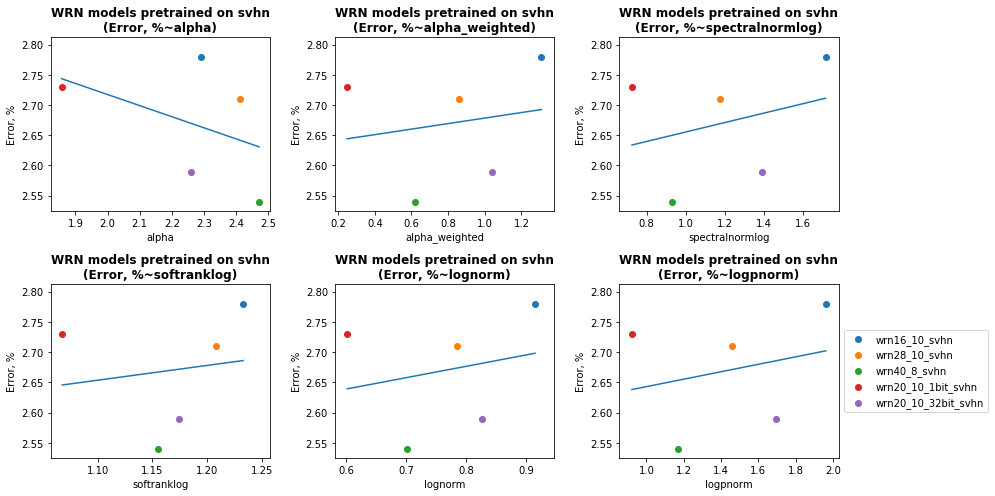

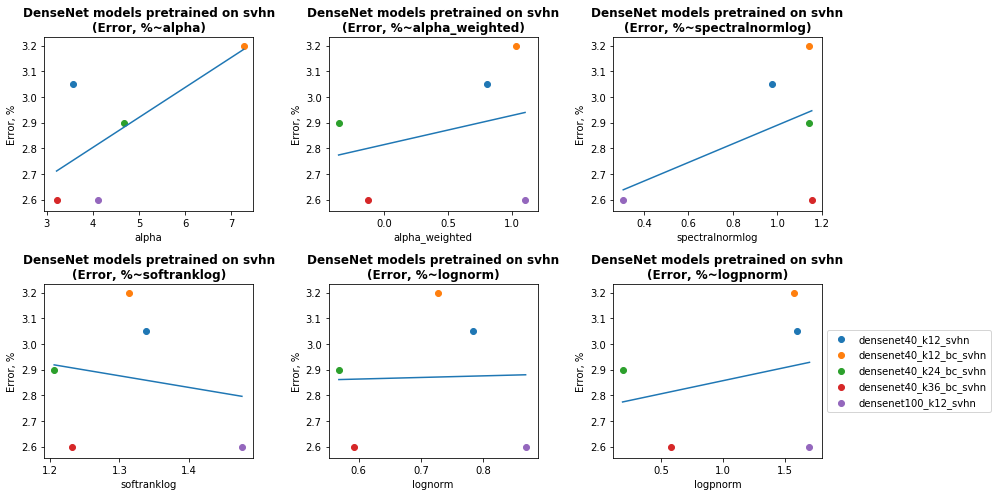

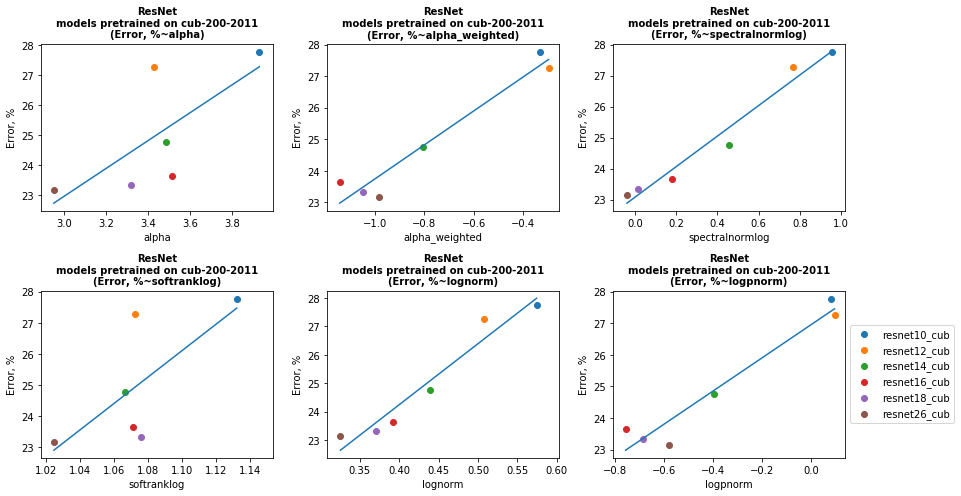

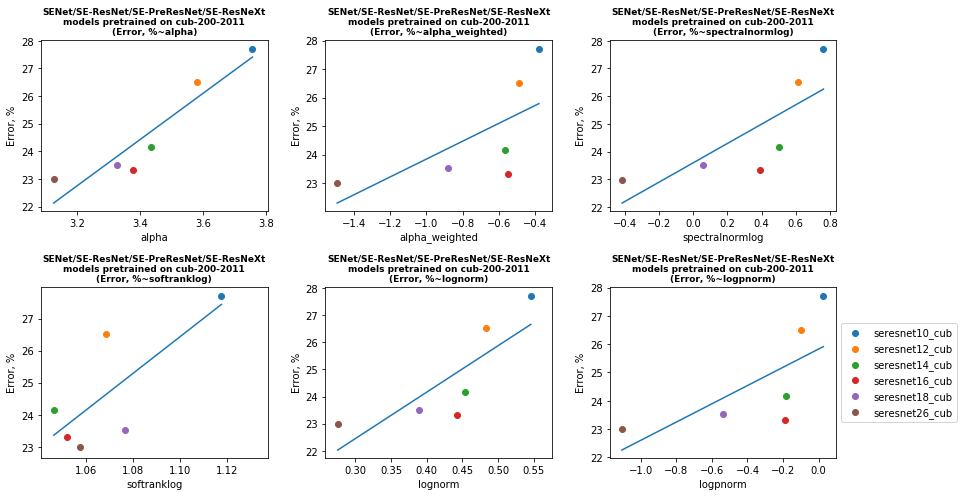

In [22]:
'''Fit a simple or polynomial on to the graph from above
ALL SIMPLE LINEAR FIT

Drop models that have less than 3 datapoints and incorrect fit

output:
-------------------
1. Plots
2. df_fit (next cell): records the X, Y, degree, SSE and MSE for the fit'''


#ply_degree = 2
df_fit = []
todelete = False
for d in datasets:
    df = df_full[d].copy()

    df.dropna(inplace=True)
    this_groups = df['group'].value_counts().to_frame()


    for g in this_groups[this_groups['group'] > 1].index:

        this_group = df[df['group'] == g].copy()
        this_group = this_group.dropna().reset_index(drop = True)
        n = len(this_group) #size

        if n <= 4:
            continue

        tacc = [c for c in metrics_acc if c in this_group.columns]

        #plotloc = int(len(tacc)*len(metrics)/num_rows*100 + 10*num_cols + 1)
        plotrow = int(len(tacc)*len(metrics)/num_rows)
        plotcol = int(num_cols)
        plotidx = 1

        if len(tacc) > 1:
            plt.figure(figsize = (12,20))
        else:
            plt.figure(figsize = (12,10))
        
        #if the size is too small, fit a linear reg; otherwise, fit a polynomial
        if n > 1000: #10: 
            this_deg = 2
        else:
            this_deg = 1
            
        for ac in tacc:#metrics_acc:
            for x in metrics:

                try:
                  plt.subplot(plotrow, plotcol, plotidx) #plt.subplot(plotloc)
                  for i in range(len(this_group)):
                      plt.scatter(this_group.loc[i,x], this_group.loc[i, ac], label = this_group.loc[i, 'modelname'])
                  plt.xlabel(x)
                  plt.ylabel(ac)
                  if len(g) > 35:
                      plt.title('{}\nmodels pretrained on {}\n({}~{})'.format(g, d, ac, x), 
                                fontweight = 'bold', fontsize = 9)
                  elif (len(g) > 20) | (len(g) + len(d) >= 17):
                      plt.title('{}\nmodels pretrained on {}\n({}~{})'.format(g, d, ac, x), 
                                fontweight = 'bold', fontsize = 10)
                  else:
                      plt.title('{} models pretrained on {}\n({}~{})'.format(g, d, ac, x), 
                                fontweight = 'bold')

                
                  # this_fit = np.polyfit(this_group[x], this_group[ac], 
                  #                       this_deg ,full = True)
                  # coef = this_fit[0]
                  this_fit = sm.OLS(this_group[ac], sm.add_constant(this_group[x])).fit()
                  if (x == 'alpha_weighted') & (this_fit.params[1] < 0):
                      todelete = True

                  coef = this_fit.params[x] #this_fit[0]
                  this_x = np.linspace(min(this_group[x]), max(this_group[x]), 50)

                  plt.plot(this_x, this_fit.predict(sm.add_constant(this_x))) ##coef[0]*this_x**2 + coef[1]*this_x + coef[2]) 

                  try:
                      this_sse = this_fit.ssr ##this_fit[1][0]
                      this_rsquared = this_fit.rsquared
                  except:
                      pass
                      # try:
                      #     this_sse = np.sum((coef[0]*this_group[x]**2 + coef[1]*this_group[x] + coef[2] - this_group[ac])**2)
                      # except:
                      #     this_sse = np.sum((coef[0]*this_group[x] + coef[1] - this_group[ac])**2)                                

                  this_arch = [d, g, ac, x, this_deg, n, this_rsquared, this_sse, this_sse/n]

                except np.linalg.LinAlgError: #does not converge
                    print("{} did not converge {}".format(d))
                    this_arch = [d, g, ac, x, this_deg, n, 'Not converge', np.nan, np.nan]

                df_fit.append(this_arch)
                #plotloc += 1
                plotidx += 1

            #plt.legend(loc='center left', bbox_to_anchor=(1, 0.5)) #this_group['Model']
        plt.tight_layout()

        if len(this_group['Model']) > 12:
            plt.legend(loc='center left', ncol = 2, bbox_to_anchor=(1, 0.5))                      
        else:
            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  

        if todelete:
            plt.close()
            todelete = False

del df
del this_group
del this_sse

In [23]:
df_fit = pd.DataFrame(df_fit, columns = ['Dataset', 'Archtecture', 'Test Accuracy', 
                                          'x Variable', 'Poly Degree','# of Models', 
                                         'r^2', 'SSE', 'MSE'])
df_fit = df_fit[df_fit['# of Models'] > 2].reset_index(drop = True)
print("number of records {}".format(len(df_fit)))
df_fit.dropna(inplace=True)

df_fit

number of records 228


,Dataset,Archtecture,Test Accuracy,x Variable,Poly Degree,# of Models,r^2,SSE,MSE
0,imagenet-1k,EfficientNet,Top1,alpha,1,22,0.716940,57.821998,2.628273
1,imagenet-1k,EfficientNet,Top1,alpha_weighted,1,22,0.000623,204.147733,9.279442
2,imagenet-1k,EfficientNet,Top1,spectralnormlog,1,22,0.000121,204.250365,9.284107
3,imagenet-1k,EfficientNet,Top1,softranklog,1,22,0.734187,54.299011,2.468137
4,imagenet-1k,EfficientNet,Top1,lognorm,1,22,0.004017,203.454371,9.247926
...,...,...,...,...,...,...,...,...,...
223,cub-200-2011,SENet/SE-ResNet/SE-PreResNet/SE-ResNeXt,"Error, %",alpha_weighted,1,6,0.436684,10.651695,1.775283
224,cub-200-2011,SENet/SE-ResNet/SE-PreResNet/SE-ResNeXt,"Error, %",spectralnormlog,1,6,0.597914,7.603012,1.267169
225,cub-200-2011,SENet/SE-ResNet/SE-PreResNet/SE-ResNeXt,"Error, %",softranklog,1,6,0.583158,7.882041,1.313673
226,cub-200-2011,SENet/SE-ResNet/SE-PreResNet/SE-ResNeXt,"Error, %",lognorm,1,6,0.660650,6.416743,1.069457


In [0]:
## df_fit records the X, Y, SSE, and MSE for the fit
df_fit.to_excel(path + '/' + 'df_fit.xlsx')


In [24]:
for x in ['r^2', 'MSE']:
    temp = df_fit.copy()
    temp = temp[temp['# of Models'] > 5].reset_index(drop = True)
    df_fitp = temp.pivot_table(values = x, columns = 'x Variable', 
                            index = ['Dataset', 'Archtecture', 'Test Accuracy'])

    print('For ' + x + ':')
    summary = df_fitp.describe()
    display(summary)
    print('===============================================')

del df_fitp

For r^2:


x Variable,alpha,alpha_weighted,lognorm,logpnorm,softranklog,spectralnormlog
count,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000
mean,0.417690,0.662947,0.567373,0.649502,0.348809,0.570557
std,0.292207,0.301714,0.327815,0.309874,0.301392,0.346679
min,0.000684,0.000035,0.004017,0.000114,0.000011,0.000121
25%,0.167656,0.431473,0.247499,0.425956,0.050709,0.196946
50%,0.403247,0.818296,0.643727,0.811480,0.276260,0.671343
75%,0.682818,0.890320,0.846346,0.880034,0.550025,0.854855
max,0.898426,0.968870,0.962030,0.968310,0.895637,0.967011


For MSE:


x Variable,alpha,alpha_weighted,lognorm,logpnorm,softranklog,spectralnormlog
count,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000
mean,10.484190,4.539311,6.430464,4.499033,9.872111,8.020661
std,18.018091,8.616557,10.451059,8.163326,20.696399,18.112922
min,0.000642,0.002028,0.002547,0.002495,0.001551,0.002561
25%,0.414331,0.156746,0.199843,0.159565,0.664856,0.193008
50%,1.586683,1.158870,1.230525,1.193275,1.702102,1.267169
75%,13.401591,5.547053,9.247926,5.658546,11.716804,4.754072
max,82.771071,45.253774,37.034441,41.815059,103.948446,83.477187


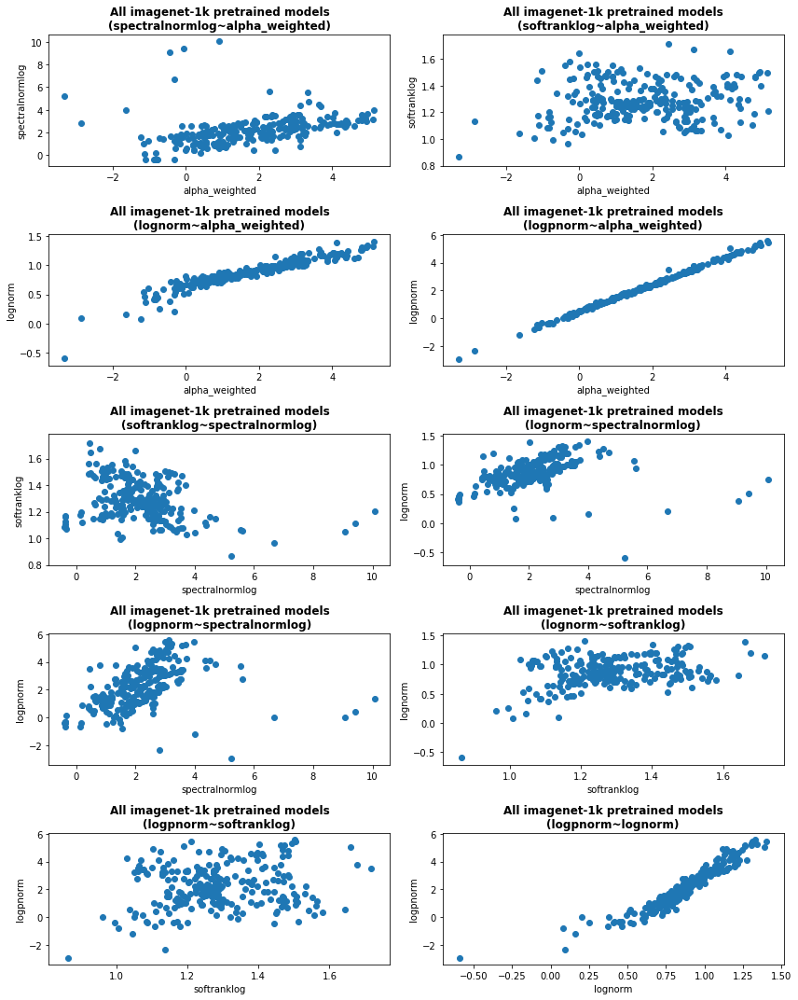

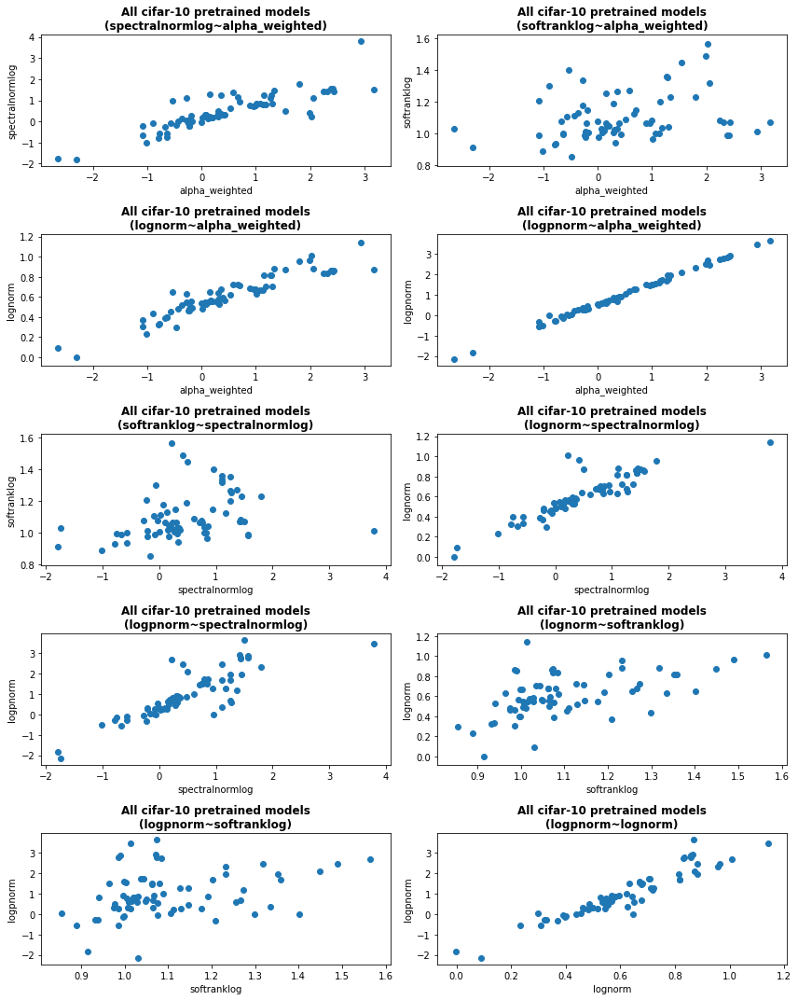

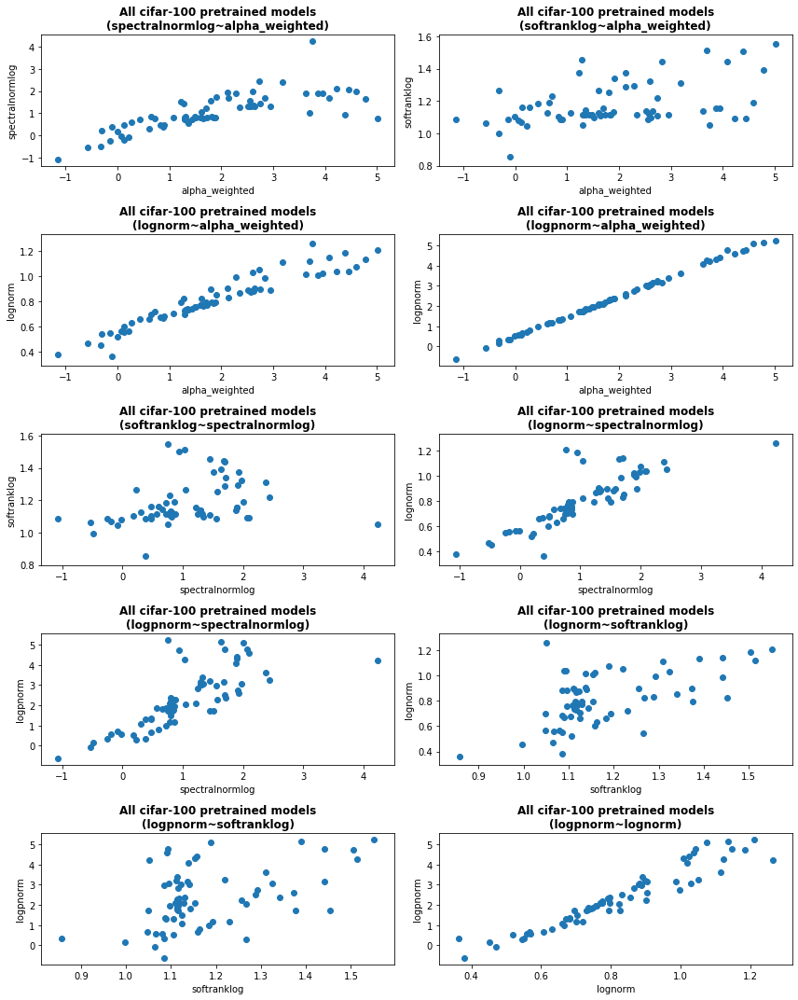

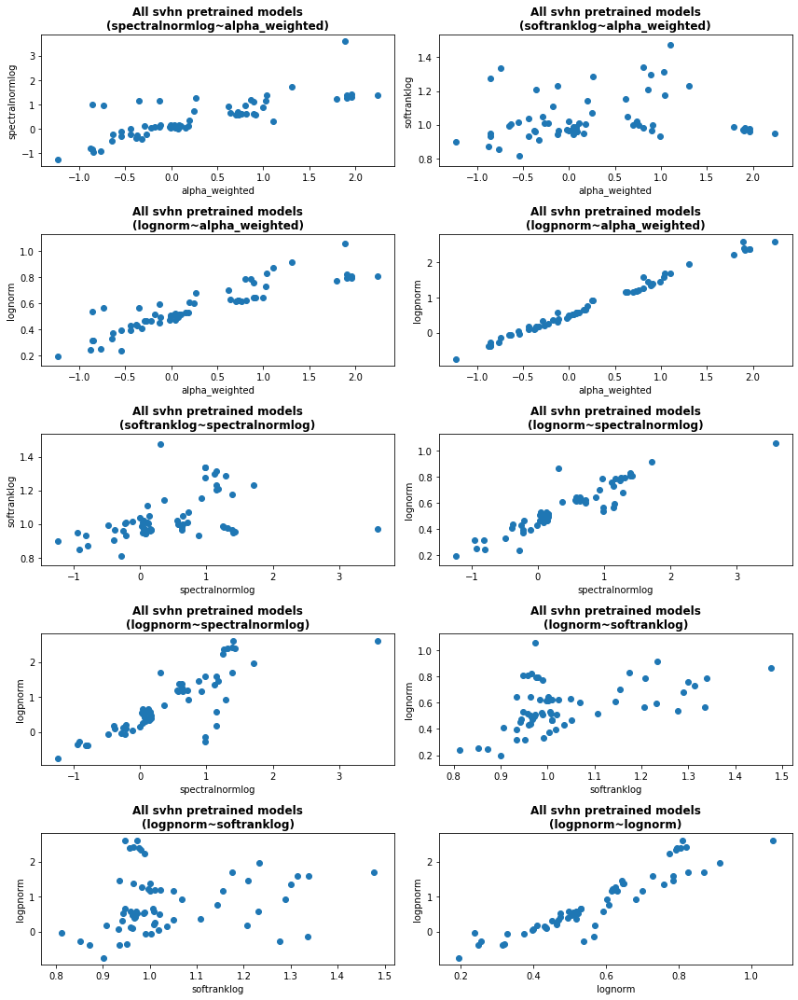

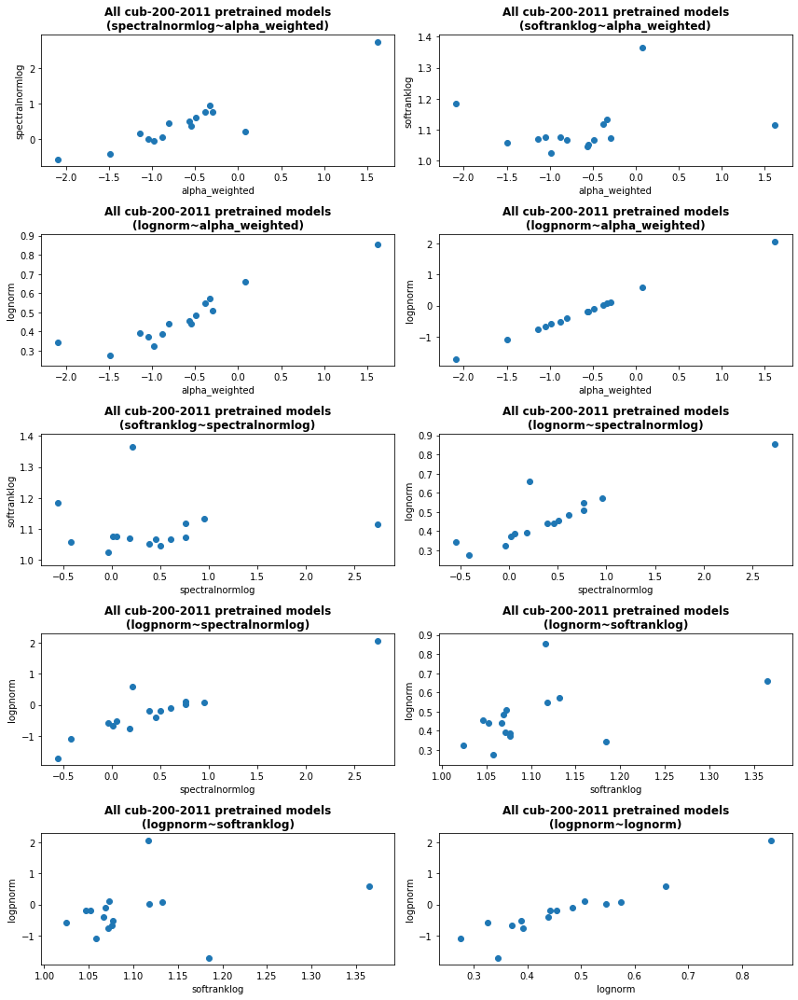

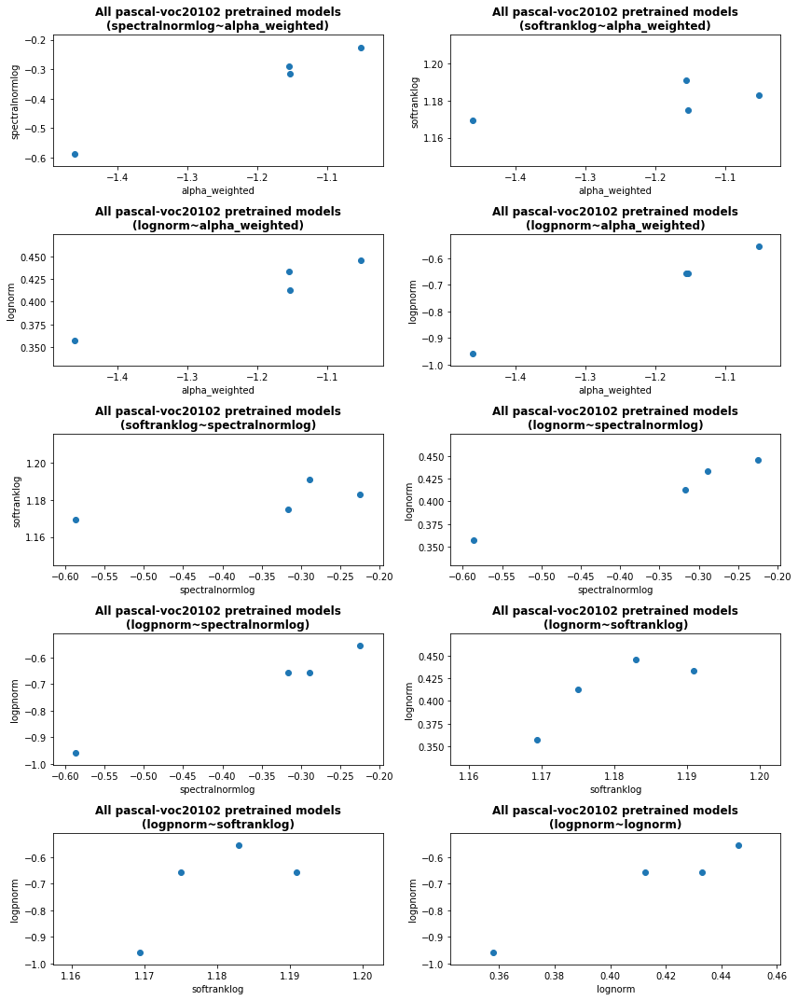

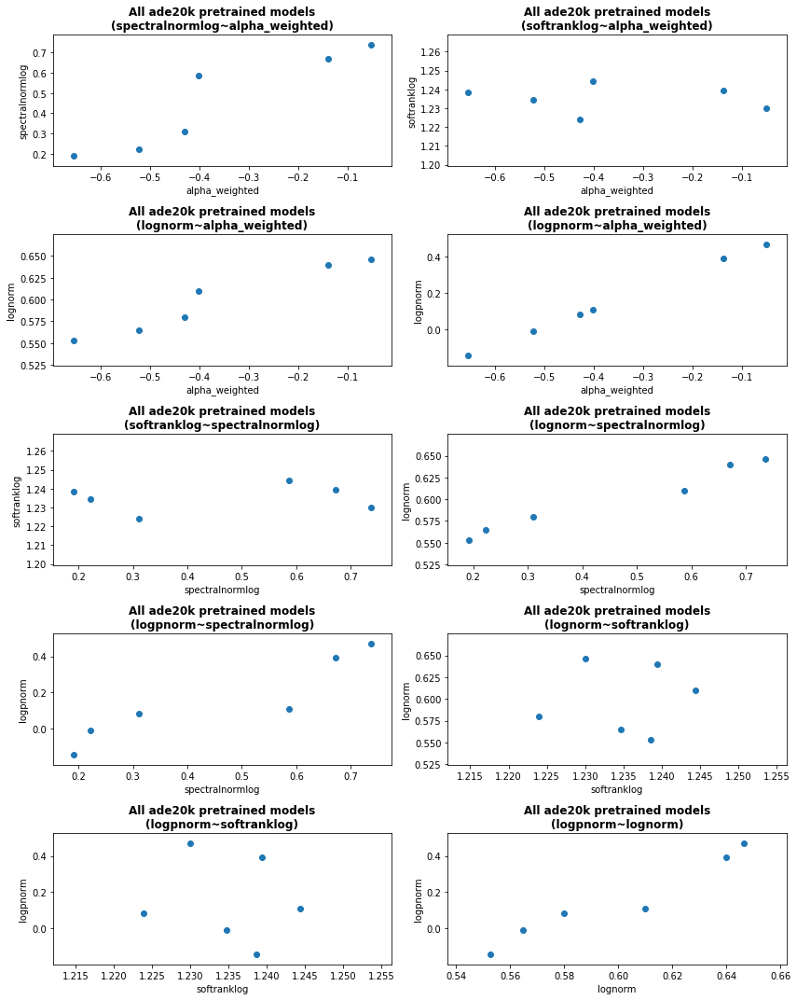

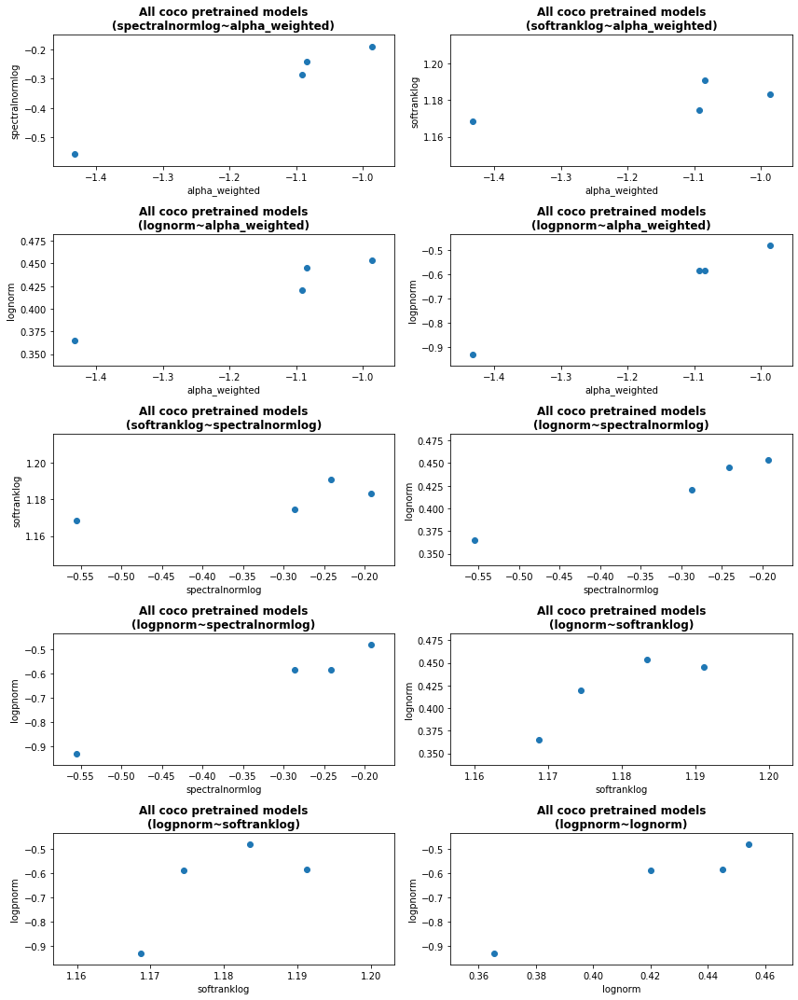

In [25]:
'''Between the ww metrics
with alpha_weighted'''

for d in datasets:
    temp = df_full[d].copy()
    df = temp.dropna()
    if len(temp) == 1:
        continue

    xys = list(itertools.combinations(metrics[1:],2)) #list(itertools.combinations(metrics[:1] + metrics[2:],2))
    
    if len(xys)%2 == 0:
       plotrow = int(len(xys)/2)
       plotcol = 2
       plotidx = 1
    elif len(xys)%3 == 0:
       plotrow = int(len(xys)/3)
       plotcol = 3
       plotidx = 1

    plt.figure(figsize = (12, 3*plotrow))
    for x, y in xys: #tertools.combinations(metrics[:1] + metrics[2:],2):
        plt.subplot(plotrow, plotcol, plotidx) #plt.subplot(plotloc)
        plt.scatter(df[x], df[y])
        plt.xlabel(x)
        plt.ylabel(y)
        plt.title('All {} pretrained models\n({}~{})'.format(d, y, x), 
                  fontweight = 'bold')
        #plt.figure(figsize = (10,10))
        #plt.show()

        #plotloc += 1
        plotidx += 1
    
    plt.tight_layout()

del temp


## Analysis of *VGG* 

In [26]:
df = df_full['imagenet-1k'].copy()
vgg_df = df[df.Model.str.contains('VGG')]
display(vgg_df)

,Model,Top1,Top5,Params,FLOPs/2,modelname,group,alpha,alpha_compound,alpha_weighted,alpha_weighted_compound,check,checkTF,checkTF_compound,check_compound,lognorm,lognormX,lognormX_compound,lognorm_compound,logpnorm,logpnorm_compound,logspectralnorm,logspectralnorm_compound,norm,normX,normX_compound,norm_compound,numofSpikes,numofSpikes_compound,ratio_numofSpikes,ratio_numofSpikes_compound,sigma_mp,sigma_mp_compound,softrank,softrank_compound,softrank_mp,softrank_mp_compound,softranklog,softranklog_compound,softranklogratio,softranklogratio_compound,spectralnorm,spectralnorm_compound,spectralnormlog
4,VGG-11,29.90,10.36,132863336,"7,615.87M",vgg11,VGG/BN-VGG,2.718865,2.633820,3.173529,3.013562,1.943881,0.653333,0.494949,1.474718,1.199311,1.497726,1.491117,1.242720,3.634474,3.530661,1.267745,1.222273,16.136616,33.025490,32.176971,18.019598,31.818182,87.777778,0.132913,0.131504,0.826833,0.757683,19.147906,26.872274,0.196762,0.169916,1.226026,1.337490,2.089823,2.210968,25.952868,22.639509,3.256282
5,VGG-13,28.76,9.75,133047848,"11,317.65M",vgg13,VGG/BN-VGG,2.672990,2.613508,2.879281,2.809776,1.574611,0.731183,0.581197,1.253330,1.120842,1.382675,1.397651,1.172892,3.327236,3.296893,1.125296,1.115280,13.732905,25.065884,25.802404,15.765934,24.071429,78.129630,0.102914,0.109463,0.881762,0.809640,17.426767,23.828012,0.275289,0.236409,1.171739,1.274388,2.143203,2.228972,16.257856,15.396934,2.788576
6,VGG-16,26.98,8.65,138357544,"15,480.10M",vgg16,VGG/BN-VGG,2.946370,2.844555,2.868102,2.781070,1.369025,0.816667,0.680556,1.142189,1.102418,1.307379,1.324641,1.143014,3.305105,3.262856,1.020445,1.018037,13.089538,21.167753,21.927551,14.595515,17.522523,54.822222,0.077295,0.085262,0.886684,0.827511,19.942711,24.892518,0.358691,0.316522,1.231329,1.306745,2.344327,2.399790,13.042012,12.570733,2.568176
7,VGG-19,25.74,7.90,143667240,"19,642.55M",vgg19,VGG/BN-VGG,3.028789,2.936001,2.721079,2.655972,1.236985,0.877551,0.754386,1.064483,1.086959,1.253255,1.270889,1.121723,3.176235,3.151616,0.942729,0.943589,12.587721,18.770487,19.488028,13.843801,14.072464,44.629630,0.062303,0.070238,0.893400,0.843418,21.885570,26.285005,0.441229,0.397147,1.272566,1.335057,2.529596,2.568992,11.063251,10.764618,2.403629
8,BN-VGG-11,29.01,9.61,132866088,"7,630.21M",bn_vgg11,VGG/BN-VGG,2.812567,2.928575,2.953986,3.083504,1.457117,0.786667,0.595960,1.106200,1.143927,1.362498,1.413718,1.214632,3.374030,3.585968,1.098568,1.079480,14.454758,23.950003,27.165796,17.497595,26.151515,85.666667,0.098840,0.106479,0.826962,0.763558,20.695696,35.236391,0.250315,0.213175,1.246939,1.393922,2.239052,2.399044,14.531276,13.674872,2.676303
9,BN-VGG-13,27.83,9.13,133050792,"11,341.62M",bn_vgg13,VGG/BN-VGG,3.026543,3.076305,2.909425,3.024383,1.277023,0.860215,0.683761,1.017040,1.067955,1.252810,1.320395,1.143925,3.290613,3.487364,0.976198,0.984237,12.669179,19.548340,23.247675,15.611608,19.440476,70.527778,0.070508,0.083114,0.875127,0.811377,18.853635,31.614661,0.387456,0.326293,1.196493,1.331520,2.323766,2.441528,10.896120,10.893690,2.388407
10,BN-VGG-16,25.72,7.79,138361768,"15,506.38M",bn_vgg16,VGG/BN-VGG,3.211754,3.605224,2.887220,3.239799,1.136738,0.900000,0.750000,0.948803,1.057912,1.206936,1.259677,1.115655,3.269318,3.610127,0.908522,0.916665,12.224429,17.461948,20.035973,14.366530,15.036036,56.274074,0.055026,0.068479,0.880529,0.823556,20.828746,30.896588,0.458759,0.398106,1.235440,1.337207,2.499150,2.589718,9.565153,9.587558,2.258127
11,BN-VGG-19,24.13,7.12,143672744,"19,671.15M",bn_vgg19,VGG/BN-VGG,3.372452,3.716457,2.855376,3.154638,1.044824,0.918367,0.789474,0.899419,1.048925,1.165554,1.210634,1.095824,3.232399,3.517367,0.849776,0.859827,11.865840,15.876125,17.901974,13.560536,11.702899,43.253086,0.043965,0.055707,0.888342,0.839320,22.075395,30.248489,0.541619,0.480343,1.272802,1.352316,2.684665,2.746661,8.489723,8.554314,2.138856
12,BN-VGG-11b,29.56,9.96,132868840,"7,630.72M",bn_vgg11b,VGG/BN-VGG,2.837721,2.916618,2.974528,3.056035,1.436948,0.813333,0.616162,1.090876,1.140501,

In [27]:
display(vgg_df[['Model', 'Top1', 'alpha', 'norm', 'alpha_weighted']].sort_values('Top1').reset_index(drop = True))

,Model,Top1,alpha,norm,alpha_weighted
0,BN-VGG-19,24.13,3.372452,11.865840,2.855376
1,BN-VGG-16,25.72,3.211754,12.224429,2.887220
2,VGG-19,25.74,3.028789,12.587721,2.721079
3,BN-VGG-19b,26.06,3.202933,13.074362,2.950156
4,VGG-16,26.98,2.946370,13.089538,2.868102
5,BN-VGG-16b,27.19,3.025120,13.742551,3.043887
6,BN-VGG-13,27.83,3.026543,12.669179,2.909425
7,BN-VGG-13b,28.41,2.953077,14.002452,3.204393
8,VGG-13,28.76,2.672990,13.732905,2.879281
9,BN-VGG-11,29.01,2.812567,14.454758,2.953986


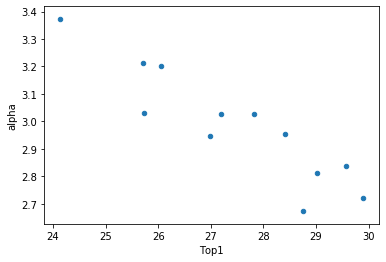

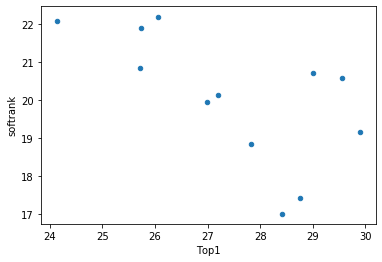

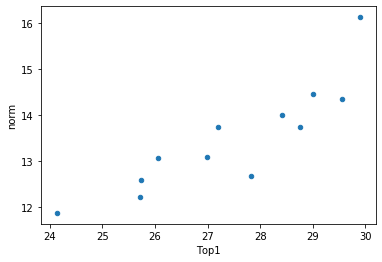

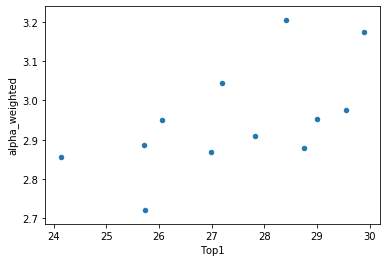

In [28]:
vgg_df.plot(x='Top1', y= 'alpha', kind='scatter')
vgg_df.plot(x='Top1', y= 'softrank', kind='scatter')
vgg_df.plot(x='Top1', y= 'norm', kind='scatter')
vgg_df.plot(x='Top1', y= 'alpha_weighted', kind='scatter')

## **HuggingFace Models**

### **1. Analyze all models using Weightwatcher**

In [0]:
!pip install pytorch-transformers

In [0]:
import pytorch_transformers as pt
import torch

In [0]:
hf_models = pd.read_html('https://huggingface.co/pytorch-transformers/pretrained_models.html')[0]
hf_models.head()

,Architecture,Shortcut name,Details of the model
0,BERT,bert-base-uncased,"12-layer, 768-hidden, 12-heads, 110M parameter..."
1,BERT,bert-large-uncased,"24-layer, 1024-hidden, 16-heads, 340M paramete..."
2,BERT,bert-base-cased,"12-layer, 768-hidden, 12-heads, 110M parameter..."
3,BERT,bert-large-cased,"24-layer, 1024-hidden, 16-heads, 340M paramete..."
4,BERT,bert-base-multilingual-uncased,"(Original, not recommended) 12-layer, 768-hidd..."


In [0]:
# PyTorch-Transformers has a unified API
# for 7 transformer architectures and 30 pretrained weights.
#          Model              | Tokenizer             | Pretrained weights shortcuts
MODELS = [(pt.BertModel,       pt.BertTokenizer,       hf_models.loc[hf_models['Architecture'] == 'BERT', 'Shortcut name'].tolist()),
          (pt.OpenAIGPTModel,  pt.OpenAIGPTTokenizer,  hf_models.loc[hf_models['Architecture'] == 'GPT', 'Shortcut name'].tolist()),
          (pt.GPT2Model,       pt.GPT2Tokenizer,       hf_models.loc[hf_models['Architecture'] == 'GPT-2', 'Shortcut name'].tolist()),
          (pt.TransfoXLModel,  pt.TransfoXLTokenizer,  hf_models.loc[hf_models['Architecture'] == 'Transformer-XL', 'Shortcut name'].tolist()),
          (pt.XLNetModel,      pt.XLNetTokenizer,      hf_models.loc[hf_models['Architecture'] == 'XLNet', 'Shortcut name'].tolist()),
          (pt.XLMModel,        pt.XLMTokenizer,        hf_models.loc[hf_models['Architecture'] == 'XLM', 'Shortcut name'].tolist()),
          (pt.RobertaModel,    pt.RobertaTokenizer,    hf_models.loc[hf_models['Architecture'] == 'RoBERTa', 'Shortcut name'].tolist()),
          (pt.DistilBertModel, pt.DistilBertTokenizer, hf_models.loc[hf_models['Architecture'] == 'DistilBERT', 'Shortcut name'].tolist())]


In [0]:
'''Run the HuggingFace Models'''
data_hf = {}
i = 0
for model_class, tokenizer_class, pretrained_weights in MODELS[6:]:
    # Load pretrained model/tokenizer
    #tokenizer = tokenizer_class.from_pretrained(pretrained_weights)
    
    for m in pretrained_weights:
        
        if (m == 'roberta-base') | (m == 'roberta-large'):
            continue
            
        s = time.time()
        model = model_class.from_pretrained(m)
        
        ## apply ww
        watcher = ww.WeightWatcher(model=model, logger=logger)
        results = watcher.analyze(alphas = True, spectralnorms=True, softranks=True)
        
        data_hf[m]=watcher.get_summary()
        e = time.time()
        
        print('\nTime spent to run {} model is {} minutes'.format(m, (e-s)/60.))
        print('----------------------------------------------------------------')
        
        df_hf = pd.DataFrame.from_dict(data_hf).transpose()
        df_hf.to_excel('/content/drive/My Drive/data_hf_{}.xlsx'.format(m))

        i += 0

In [0]:
try:
    df_hugging = pd.read_excel(path + '/df_hugging.xlsx')\
                .rename(columns = {'Unnamed: 0': 'Architecture'})
    df_hugging['Architecture'] = df_hugging['Architecture'].fillna(method = 'ffill')
except:
    print("Concating...")
    df_hugging = pd.DataFrame()
    for f in os.listdir(path):
        if f.startswith('data_hf'):
            temp = pd.read_excel(path + '/' + f)\
                        .rename(columns = {'Unnamed: 0':'modelname'})
            print(f)
            df_hugging = pd.concat([df_hugging, temp], axis = 0, sort = False)

    df_hugging = df_hugging.drop_duplicates().reset_index(drop = True)

    df_hugging = df_hugging.merge(hf_models.loc[:, ['Architecture',	'Shortcut name']],
                                  left_on = 'modelname', right_on = 'Shortcut name',
                                  how = 'left').drop(['Shortcut name'], axis = 1)

    df_hugging = df_hugging[['Architecture'] + df_hugging.columns[:-1].tolist()]

    del temp

    df_hugging = df_hugging.set_index(['modelname'])
    df_hugging = df_hugging.loc[hf_models['Shortcut name'],:].reset_index()

    df_hugging.to_excel(path + '/df_hugging.xlsx')

# if len(df_hugging) != len(hf_models):
#     print('Missing models')

df_hugging.head()

,Architecture,modelname,alpha,alpha_compound,alpha_weighted,alpha_weighted_compound,lognorm,lognorm_compound,norm,norm_compound,softrank,softrank_compound,softranklog,softranklog_compound,softranklogratio,softranklogratio_compound,spectralnorm,spectralnorm_compound
0,Bert,bert-base-uncased,4.006251,4.006251,5.520487,5.520487,1.566235,1.566235,41.571056,41.571056,56.459637,56.459637,1.662696,1.662696,2.407257,2.407257,420.008881,420.008881
1,Bert,bert-large-uncased,4.182942,4.182942,6.078965,6.078965,1.626763,1.626763,46.678444,46.678444,66.624610,66.624610,1.721711,1.721711,2.413127,2.413127,211.702621,211.702621
2,Bert,bert-base-cased,3.873442,3.873442,5.163987,5.163987,1.532904,1.532904,38.390232,38.390232,54.715865,54.715865,1.660536,1.660536,2.462148,2.462148,149.275208,149.275208
3,Bert,bert-large-cased,4.133658,4.133658,6.120481,6.120481,1.631184,1.631184,47.345066,47.345066,63.537351,63.537351,1.699848,1.699848,2.374098,2.374098,171.152267,171.152267
4,Bert,bert-base-multilingual-uncased,3.625840,3.625840,5.145978,5.145978,1.557176,1.557176,42.508667,42.508667,52.563356,52.563356,1.659431,1.659431,2.330454,2.330454,257.559631,257.559631


### **2. Plots**

<Figure size 720x1080 with 0 Axes>

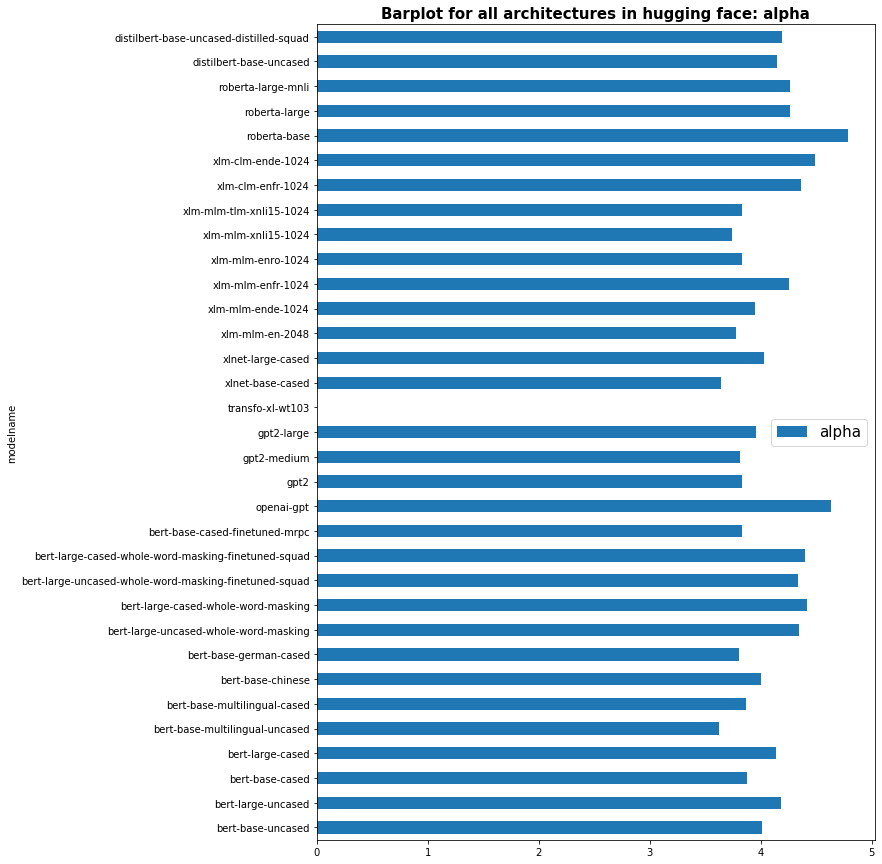

<Figure size 720x1080 with 0 Axes>

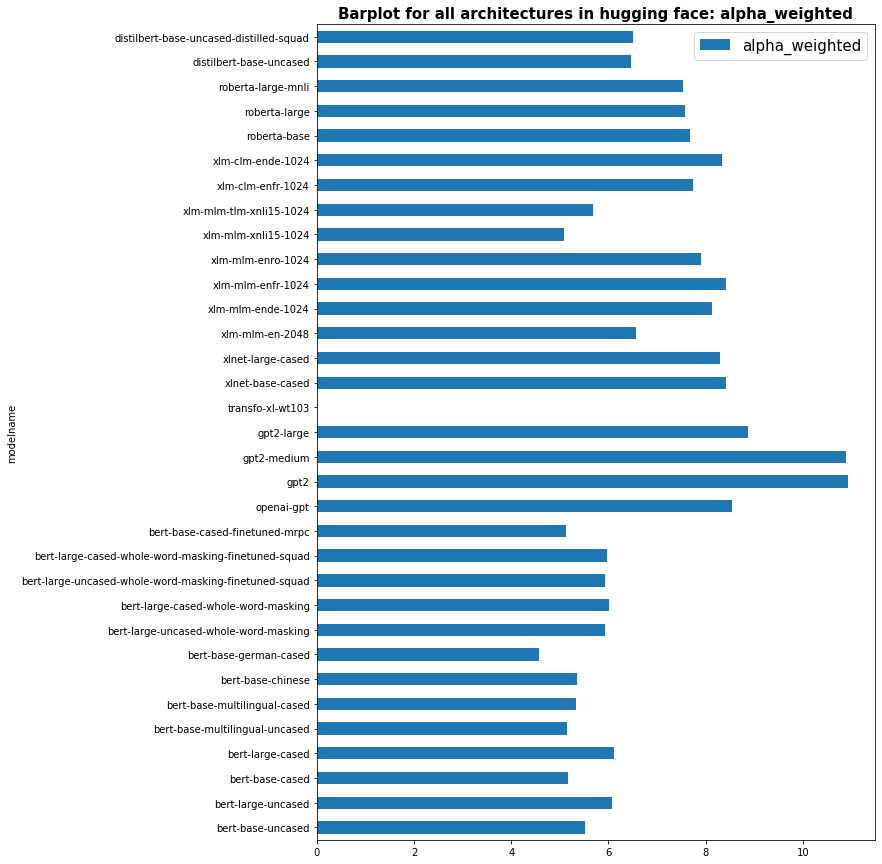

<Figure size 720x1080 with 0 Axes>

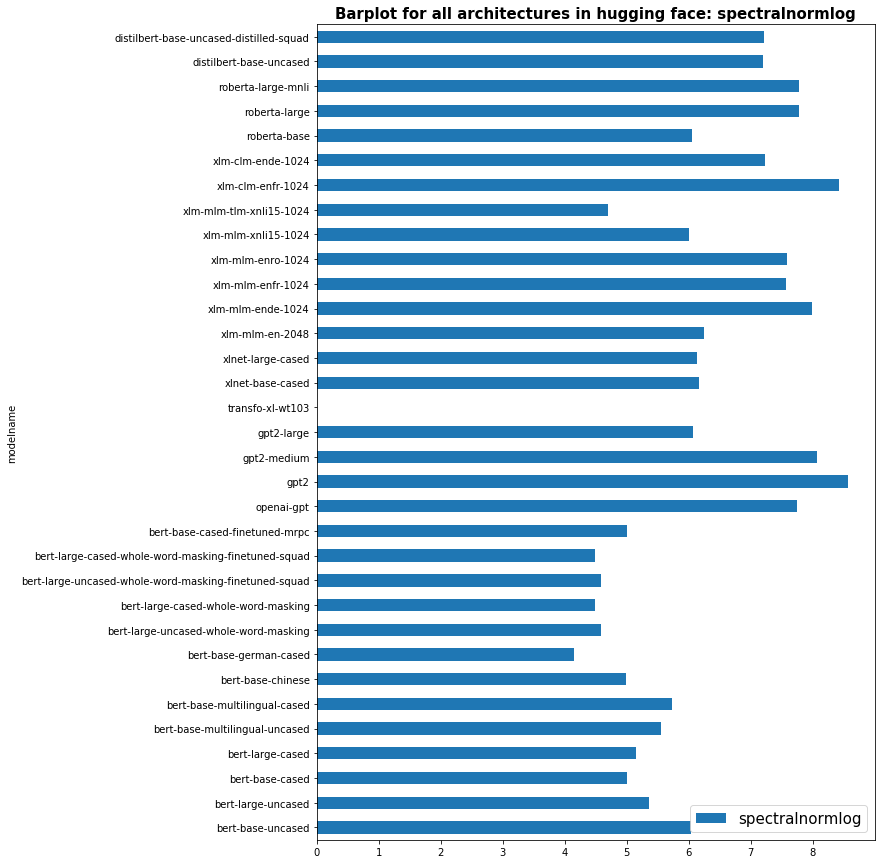

<Figure size 720x1080 with 0 Axes>

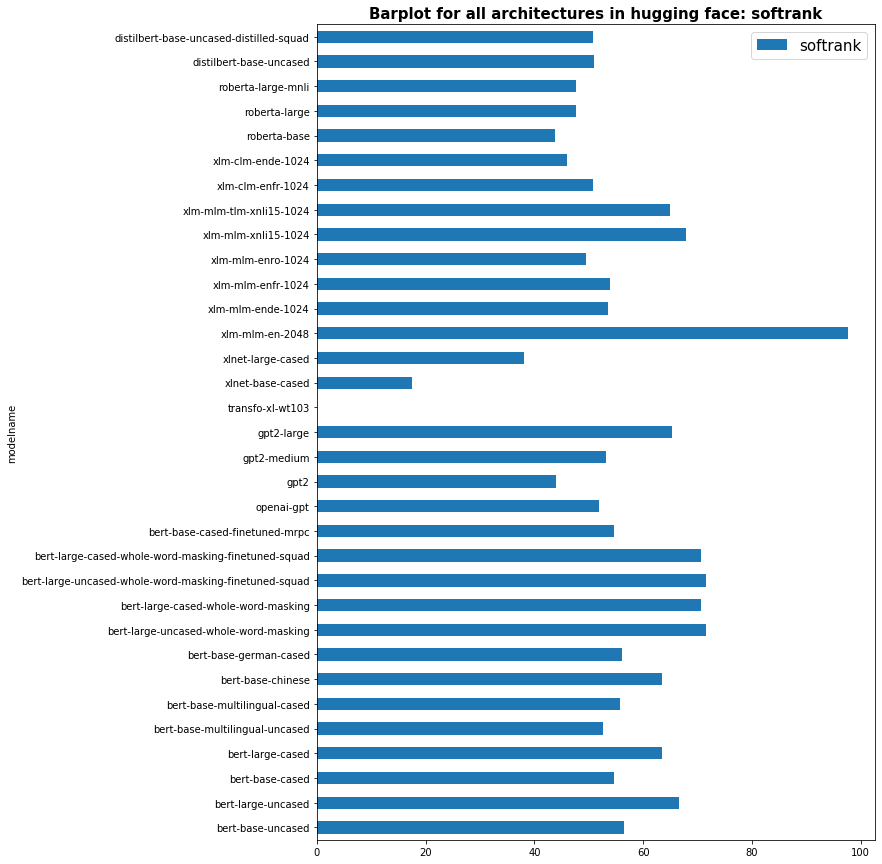

In [0]:
## Barplot for all archtectures
try:
    df_hugging
except:
    df_hugging = pd.read_excel(path + '/df_hugging.xlsx')\
                .rename(columns = {'Unnamed: 0': 'Architecture'})
    df_hugging['Architecture'] = df_hugging['Architecture'].fillna(method = 'ffill')

metrics = ['alpha', 'alpha_weighted', 'spectralnormlog', 'softrank']
df_hugging['spectralnormlog'] = np.log(df_hugging['spectralnorm'])

for m in metrics:
    plt.figure(figsize = (10,15))
    df_hugging.plot.barh(x = 'modelname', y = m, figsize = (10,15))
    plt.title('Barplot for all architectures in hugging face: {}'.format(m), fontweight = 'bold', fontsize = 15)
    plt.legend([m], fontsize = 15)


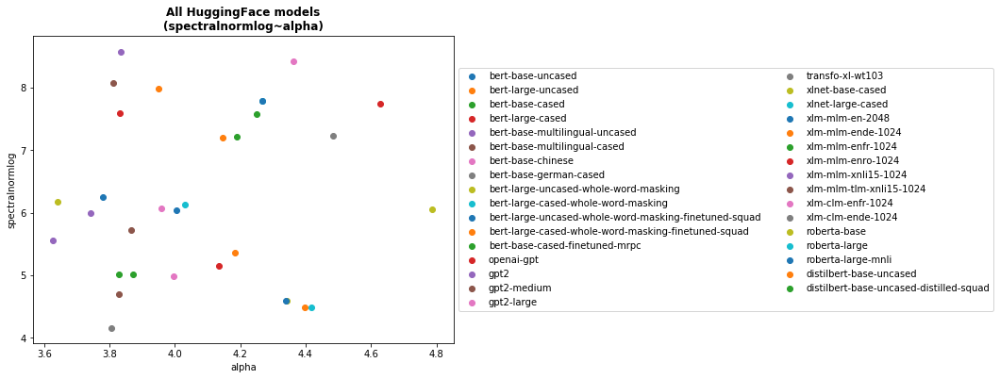

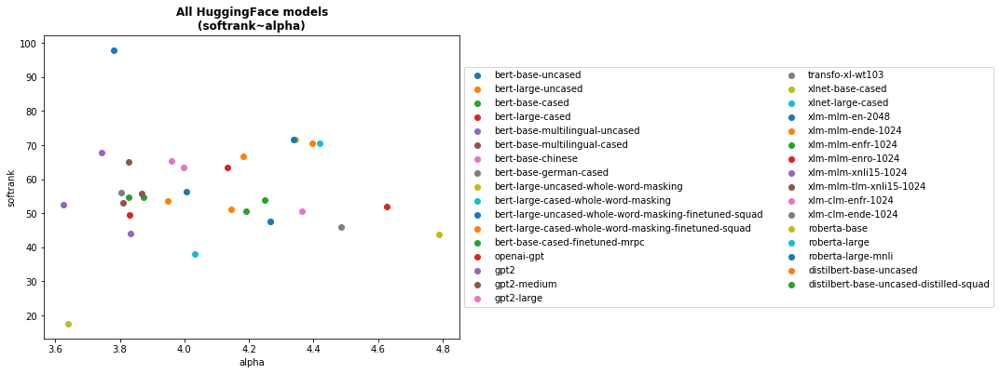

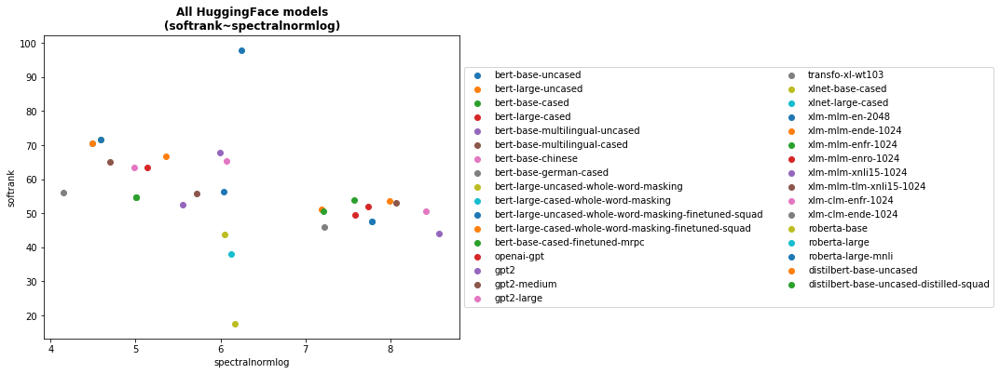

In [0]:
## Scatter plot for other metrics
temp = df_hugging.copy()

for x, y in itertools.combinations(metrics[:1] + metrics[2:],2):
    plt.figure(figsize = (8, 6))
    for i in range(len(df_hugging)):
        plt.scatter(temp.loc[i, x], temp.loc[i, y], label = temp.loc[i, 'modelname'])
    plt.xlabel(x)
    plt.ylabel(y)
    plt.title('All HuggingFace models\n({}~{})'.format(y, x), 
              fontweight = 'bold')  
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=2)  

    
del temp